In [1]:
cd ..

/Users/yanndubois/SSL-Risk-Decomposition


In [2]:
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'

In [3]:
#!rm -rf /Users/yanndubois/.cache/torch/hub/YannDubs_SSL-Risk-Decomposition_main

# Collect all results

In [4]:
import torch
import pandas as pd
from utils.plotting import *
from utils.collect_results import *
from utils.causal import *
import numpy as np
import warnings
import logging
import hubconf
from pathlib import Path

 No module named 'clip'


In [5]:
df, metadata_df = load_df()

df_sup = df.query("ssl_mode == 'supervised'")
df_init = df.query("ssl_mode == 'initialized'")
df = df.query("ssl_mode != 'initialized' & ssl_mode != 'supervised'")
df_IN = df.query("pretraining_data == 'ImageNet-1K'")

Found 178 result files to load.


Missing results for: init_rn50_d8192
Found missing supervised models for:


,pred,seed,arch
0,torch_linear_delta_hypopt,123,missing
1,torch_linear_delta_hypopt,123,missing
2,torch_linear_delta_hypopt,123,missing
3,torch_linear_delta_hypopt,123,missing
4,torch_linear_delta_hypopt,123,missing
5,torch_linear_delta_hypopt,123,missing
6,torch_linear_delta_hypopt,123,missing
7,torch_linear_delta_hypopt,123,missing
8,torch_linear_delta_hypopt,123,missing
9,torch_linear_delta_hypopt,123,missing


[usability] = [train_train] - [sup_train_train]
[probe_gen] = [train-cmplmnt-ntest_train-sbst-ntest] - [train_train]
[enc_gen] = [train_test] - [train-cmplmnt-ntest_train-sbst-ntest]


Found negative values:


,train-cmplmnt-ntest_train-sbst-ntest,train_train,train-cmplmnt-ntest_test,train_test,union_test,sup_train_train,sup_train_test,agg_risk,approx,usability,probe_gen,enc_gen
enc,,,,,,,,,,,,
dino_vitb16_extracts,19.042,0.811,23.680,23.572,NaN,1.548,16.046,23.572,1.548,-0.737,18.231,4.530
dissl_resnet50_d4096_e100_m2,32.994,0.491,32.988,32.846,NaN,0.845,24.244,32.846,0.845,-0.354,32.503,-0.148
dissl_resnet50_d8192_e100_m2,32.276,0.656,33.756,33.578,NaN,0.845,24.244,33.578,0.845,-0.189,31.620,1.302
dissl_resnet50_d8192_e400_m6,24.528,0.464,28.492,28.344,NaN,0.845,24.244,28.344,0.845,-0.381,24.064,3.816
dissl_resnet50_d8192_e800_m8,23.880,0.463,28.138,28.004,NaN,0.845,24.244,28.004,0.845,-0.382,23.417,4.124
init_vitb32,96.200,92.428,NaN,95.864,NaN,1.132,20.204,95.864,1.132,91.296,3.772,-0.336
init_vitl16,93.020,87.061,NaN,92.952,NaN,0.553,15.880,92.952,0.553,86.508,5.959,-0.068
pirl_rn50w2_headmlp,26.080,0.651,NaN,29.502,NaN,0.743,22.102,29.502,0.743,-0.091,25.429,3.422
simclr_resnet50_d8192_e100_m2,30.432,0.465,33.966,33.920,NaN,0.845,24.244,33.920,0.845,-0.381,29.967,3.488


The following results seem suspicously bad:


,agg_risk
enc,
beit_vitb16_pt22k,57.194


The following models have very different original and evalauted performance:


enc
deepcluster_rn50_bs512_ep200_mmselfsup   -17.566000
dissl_resnet50_dnone_e100_m2               5.037999
jigsaw_rn50                               10.766001
jigsaw_rn50_in22k                         17.584002
msn_vitl16_ep600                           6.359999
rotnet_rn50_in1k                           7.164002
rotnet_rn50_in22k                          7.314002
simclr_rn50_bs256_ep200_mmselfsup          6.275999
speccl_resnet50_bs384_ep100                5.306000
dtype: float64

The following results have some nan:


,approx,usability,probe_gen,enc_gen
enc,,,,
dino_vits16_extractb,NaN,NaN,10.441,4.102
dino_vits16_last,NaN,NaN,4.293,3.812
dino_vits8_last,NaN,NaN,4.449,3.818
ibot_vits16,NaN,NaN,4.515,2.740
init_vits16,NaN,NaN,1.423,0.324
init_vits16_dino_extractb,NaN,NaN,3.921,0.050
mocov3_vits_ep300,NaN,NaN,5.416,3.850
msn_vits16_ep800,NaN,NaN,5.070,3.288
mugs_vits16_ep100,NaN,NaN,5.108,3.066


In [6]:
dummy_aug = pd.get_dummies(df.augmentations.apply(pd.Series).stack()).groupby(level=0).sum()

ANY_GEOMETRIC = ["crop","flip","rotate","autoaugment"]
ANY_PHOTOMETRIC = ["blur","color","gray","photometric","solarize","autoaugment"]
dummy_aug["anygeometric"] =  dummy_aug[ANY_GEOMETRIC].any(axis=1).astype(int)
dummy_aug["anycolor"] =  dummy_aug[ANY_PHOTOMETRIC].any(axis=1).astype(int)

dummy_aug.rename(columns=dict(autoaugment="autoaug"), inplace=True)
dummy_aug.columns = [f"is_aug_{c}" for c in dummy_aug.columns]

df = pd.merge(left=df,
              right=dummy_aug,
              right_index=True,
              left_index=True)

AUGMENTATIONS = list(dummy_aug.columns)

In [7]:
std = load_all_results(pattern=f"**/seed_*/results_all.csv", 
                           skip_ifneq={}, 
                           skip_ifin=dict(ssl=["swav_rn50w5","selav2_rn50_ep400_2x160_4x96"]))
std = std[std.index.isin(['sk_logistic_hypopt','torch_linear_delta_hypopt'], level=1)]
# CORE_METRICS = ["train_test"
#                ] + [c for c in std.columns 
#                    if c.endswith("_test") and (c.startswith('train-balsbst-ntrain') or c.startswith('train-nperclass-')) ]
CORE_METRICS = ["train_test", "train-nperclass-30_test", "train-balsbst-ntrain0.01_test", "train-nperclass-5_test", "train-nperclass-3_test"]
std = std[CORE_METRICS]
assert not (std.groupby("enc").nunique() > 1).any().any()
std = std.groupby("enc").mean()
#std["delta-100%-1%"] = std["train-balsbst-ntrain0.01_test"] - std["train_test"]
METRICS = CORE_METRICS #+ ["delta-100%-1%"]

Found 1197 result files to load.


In [8]:
print("Following results are missing:")
missing=std[std.isna().any(axis=1)]
missing[[("init" not in i) and ("sup" not in i) for i in missing.index]]

Following results are missing:


,train_test,train-nperclass-30_test,train-balsbst-ntrain0.01_test,train-nperclass-5_test,train-nperclass-3_test
enc,,,,,


In [9]:
df = pd.merge(left=df,
              right=std[METRICS[1:]],
              right_index=True,
              left_index=True)

# coarsens many different parameters for cleaner plots
#df = preprocess_features(df, round_dict={}, pow_dict={})

#non_core_params = ['date_published','top1acc_in1k_official','projection_nparameters']
core_params = ['objective','version','architecture','patch_size','z_dim','z_layer',
               "epochs","batch_size", "optimizer", "learning_rate", "weight_decay", "scheduler",
               "pretraining_data",'img_size','year',"nviews",'finetuning_data','projection1_arch','projection2_arch','projection_same', 
               "n_augmentations", "other"]#, "pred_dim"
minimal_params = ['objective','version','architecture','patch_size','z_dim','z_layer',"pretraining_data",'finetuning_data']

df_core = df.set_index(core_params)[COMPONENTS]
df_minimal = df.set_index(minimal_params)[COMPONENTS]
df_nona = df[~df[COMPONENTS ].isna().any(axis=1)].copy()
df_IN = df.query("pretraining_data == 'ImageNet-1K'")

melted = melt(df)
melted_onlyComp = melt(df, components=COMPONENTS_ONLY)
#melted_wdelta = melt(df, components=COMPONENTS+["delta-100%-3shot"])


CORE_STATISTICS = ['train_rank', "train_uniformity", "trainrealaug_vars", 
                   "trainrealaug_nc1norm",  'trainrealaug_alignment']

melted_metrics = pd.melt(melted_onlyComp,
                   value_vars=METRICS,
                   id_vars=[c for c in melted_onlyComp.columns if c not in METRICS],
                   var_name="metric",
                    value_name='metric_value',
                    )

melted_Onlymetrics = pd.melt(melted_onlyComp,
                   value_vars=CORE_METRICS,
                   id_vars=[c for c in melted_onlyComp.columns if c not in CORE_METRICS],
                   var_name="metric",
                    value_name='metric_value',
                    )

In [10]:
print("Following results are missing:")
missing=df.loc[df[CORE_STATISTICS].isna().any(axis=1),CORE_STATISTICS]
missing[[("init" not in i) and ("sup" not in i) for i in missing.index]]

Following results are missing:


,train_rank,train_uniformity,trainrealaug_vars,trainrealaug_nc1norm,trainrealaug_alignment
enc,,,,,
clip_rn50x16,407.0,-2.512097,NaN,NaN,NaN
clip_rn50x4,358.0,-2.461072,NaN,NaN,NaN
clip_rn50x64,461.0,-2.601860,NaN,NaN,NaN
clip_vitl14_px336,426.0,-2.636361,NaN,NaN,NaN
dissl_resnet50_d8192_e100_m2,662.0,-2.377529,NaN,NaN,NaN
dissl_resnet50_d8192_e400_m6,1090.0,-2.020153,NaN,NaN,NaN
dissl_resnet50_d8192_e800_m8,1242.0,-2.021887,NaN,NaN,NaN
mae_vitb16,131.0,-0.350503,NaN,NaN,NaN
mae_vith14,248.0,-0.022221,NaN,NaN,NaN


## All Radar
Let's plot the (relative) decomposition of results. Note that we only plot the ones that have no NaN.

In [11]:
from IPython.display import IFrame,display

is_plot_radar = False
save_path="figures/all_radar.pdf"

if is_plot_radar:
    isna = df[COMPONENTS].isna().any(axis=1)
    plot_radar_grid(df[~isna], ncols=12, 
                    components=["agg_risk"]+COMPONENTS_ONLY, 
                    #models=~isna, 
                    save_path=save_path,
                    config_kwargs=dict(is_despine=False, font_scale=1, is_use_tex=True),
                    space_per_col=2)
else:
    out = IFrame(Path("..") / save_path, width=1000, height=500)
    display(out)

## All Results

In [12]:
large_table = df[["epochs"]+COMPONENTS_ONLY+CORE_METRICS].copy()
large_table[r"100\%"] =  large_table["train_test"] # 100 -
large_table["30 shot"] =  large_table['train-nperclass-5_test'] # 100 -
large_table[r"1\%"] =  large_table['train-balsbst-ntrain0.01_test'] # 100 -
large_table["5 shot"] =  large_table['train-nperclass-5_test'] # 100 -
large_table["3 shot"] =  large_table['train-nperclass-3_test']
large_table = large_table.drop(columns=CORE_METRICS)
model_arch, rest = zip(*[ clean_model_name(i) for i in large_table.index ])
large_table["Objective"], large_table["Arch."] = zip(*[ m.rsplit(" ",1) for m in model_arch ])
rest = [r.replace('_','\_')  for r in rest]
large_table["Other"] = [rf"\tiny{{{r}}}"  for r in rest] # can use \miniscule if want smaller
large_table = large_table.rename(columns=PRETTY_RENAMER).set_index(["Objective","Arch.","Epochs","Other"])
large_table.columns = pd.MultiIndex.from_arrays([[r"\textbf{Risk Component}"]*len(COMPONENTS_ONLY) + [r"\textbf{Aggregated Error}"]*len(CORE_METRICS), 
                                                large_table.columns])
large_table = large_table.sort_index(level=[0,1,2])



In [13]:
IS_PRINT_TEXT_TABLE = False # set True to print the table

tex_table = large_table.style.format(precision=2
                                    ).to_latex(multicol_align="c",
                                   hrules=True, 
                                   label="appx:tab:all_results",
                                    position="h",
                                 environment="longtable",
                                 multirow_align="t",
                            )

# adds multirow
tex_table= tex_table.replace("\\\\\n\\multirow","\\\\\n\\midrule\n\\multirow")
unique_obj = large_table.groupby("Objective").nunique().max(axis=1)
for o in unique_obj[unique_obj == 1].index:
    tex_table= tex_table.replace("\\\\\n"+o,"\\\\\n\\midrule\n"+o)

rows = tex_table.split("\n")
new_cols = r"} & \textbf{".join([r" "+i for i in rows[5].split("&  &")[0].split("&")]
                              ) + r"} & \textbf{" + r"} & \textbf{".join(rows[4].split("&  &")[-1].split("&"))
new_cols = r"\textbf{" + new_cols[:-2] + r"} \\"

if IS_PRINT_TEXT_TABLE:
    print(r"\begin{tiny}")
    for r in rows:
        if r.endswith(r"  &  &  &  \\"):
            continue
        elif r == rows[4]:
            print(new_cols)
            continue


        print(r)
        if r == rows[3]:
            print(r" \cmidrule(lr){5-8}  \cmidrule(lr){9-11} \ ")


        pass
    print(r"\end{tiny}")

## Validating results

### Differences with published results

In [14]:
diff = df.copy()
diff[r"100\%"] = diff["train_test"] - (100 - diff["top1acc_in1k_official"])
diff[r"1\%"] = diff["train-balsbst-ntrain0.01_test"] - (100 - diff["top1acc_in1k-1%_official"])
diff[r"5 shot"] = diff["train-nperclass-5_test"] - (100 - diff["top1acc_in1k-c5_official"])
diff = diff.iloc[:,-3:].copy()

In [15]:
print(diff.describe())
save_path = "figures/diff_published.pdf"
with plot_config(is_use_tex=True, font_scale=2):
    fig,ax = plt.subplots(1,1,figsize=(6,6))
    ax = sns.stripplot(diff, ax=ax, size=7)
    #plt.setp(ax.get_xticklabels(), rotation=45)
    ax.set_ylabel("$\Delta$ with published ($\downarrow$ is better)")
    ax.set_xlabel("Probe training data")
save_fig(ax, save_path)

#display
out = IFrame(Path("..") / save_path, width=1000, height=500)
display(out)

            100\%       1\%    5 shot
count  108.000000  9.000000  3.000000
mean     1.163148  0.265111 -0.344667
std      3.087921  2.330321  0.475657
min    -17.566000 -4.272000 -0.854000
25%      0.463999 -0.350000 -0.561000
50%      0.942000  0.170000 -0.268000
75%      1.485000  1.526000 -0.090000
max     17.584002  4.028000  0.088000


In [16]:
import scipy.stats as stats
print(stats.ttest_rel(df["train_test"], (100 - df["top1acc_in1k_official"]), nan_policy="omit"))
print(stats.ttest_rel(df["train-balsbst-ntrain0.01_test"], (100 - df["top1acc_in1k-1%_official"]), nan_policy="omit"))
print(stats.ttest_rel(df["train-nperclass-5_test"], (100 - df["top1acc_in1k-c5_official"]), nan_policy="omit"))

Ttest_relResult(statistic=3.9145390102055315, pvalue=0.00015963612774814952)
Ttest_relResult(statistic=0.3412977850347525, pvalue=0.7416705846016705)
Ttest_relResult(statistic=-1.2550651119275351, pvalue=0.3362312702180341)


In [17]:
max_delta = 3
print(f"Values that are worst by more than {max_delta}%")
idx = (diff.abs() > max_delta).any(axis=1)
big_diff = diff[idx].copy()
big_diff["epochs"] = df.loc[idx,"epochs"]

Values that are worst by more than 3%


In [17]:
def table_to_tex(table, size_other=r"\tiny", size_all=None, **kwargs):
    table = table.copy()
    model_arch, rest = zip(*[ clean_model_name(i) for i in table.index ])
    table["Objective"], table["Arch."] = zip(*[ m.rsplit(" ",1) for m in model_arch ])
    rest = [r.replace('_','\_')  for r in rest]
    table["Other"] = [size_other+rf"{{{r}}}"  for r in rest] # can use \miniscule if want smaller
    table = table.rename(columns=PRETTY_RENAMER).set_index(["Objective","Arch.","Epochs","Other"])
    #table.columns = pd.MultiIndex.from_arrays([[r"\textbf{Risk Component}"]*len(COMPONENTS_ONLY) + [r"\textbf{Aggregated Error}"]*len(CORE_METRICS), table.columns])
    table = table.sort_index(level=[0,1,2])
    
    styler = table.style.format(precision=2, na_rep="")
    tex = styler.to_latex(multicol_align="c",
                           hrules=True, 
                           position="h",
                           multirow_align="t",
                          position_float="centering",
                          **kwargs
                            )
    tex= tex.replace("\\\\\n\\multirow","\\\\\n\\midrule\n\\multirow")
    unique_obj = table.groupby("Objective").nunique().max(axis=1)
    for o in unique_obj[unique_obj == 1].index:
        tex = tex.replace("\\\\\n"+o,"\\\\\n\\midrule\n"+o)
    rows = tex.split("\n")
    
    for i_col,r  in enumerate(rows):
        if r.startswith(" &  &  &  &"):
            break
    
    # bold and add all columns on the same row
    new_cols = r"} & \textbf{".join([r" "+i for i in rows[i_col+1].split("&  &")[0].split("&")]
                              ) + r"} & \textbf{" + r"} & \textbf{".join(rows[i_col].split("&  &")[-1].split("&"))
    new_cols = r"\textbf{" + new_cols[:-2] + r"} \\"
    
    if size_all:
        print(rf"\begin{{{size_all}}}")
    for r in rows:
        if r.endswith(r"&  &  &  \\"):
            continue
        elif r == rows[i_col]:
            print(new_cols)
            continue

        print(r)

    if size_all:
        print(rf"\end{{{size_all}}}")



In [18]:
table_to_tex(big_diff, size_all="small", label="appx:tab:big_diff", size_other=r"\small")

\begin{small}
\begin{table}[h]
\centering
\label{appx:tab:big_diff}
\begin{tabular}{llllrrr}
\toprule
\textbf{ Objective } & \textbf{  Arch. } & \textbf{  Epochs } & \textbf{  Other } & \textbf{ 100\% } & \textbf{ 1\% } & \textbf{ 5 Shot } \\
\midrule
BYOL & RN50 & 1000 & \small{augnocolor} & -4.07 &  &  \\
\midrule
DISSL & RN50 & 100 & \small{dnone\_e100\_m2} & 5.04 &  &  \\
\midrule
DeepCluster & RN50 & 200 & \small{bs512\_ep200\_mmselfsup} & -17.57 &  &  \\
\midrule
\multirow[t]{2}{*}{Jigsaw} & \multirow[t]{2}{*}{RN50} & \multirow[t]{2}{*}{105} & \small{in22k} & 17.58 &  &  \\
 &  &  & \small{} & 10.77 &  &  \\
\midrule
\multirow[t]{2}{*}{MSN} & ViT-B16 & 600 & \small{ep600} &  & -4.27 &  \\
 & ViT-L16 & 300 & \small{ep600} & 6.36 &  &  \\
\midrule
MUGS & ViT-S16 & 800 & \small{ep800\_extracts} & -1.71 & 4.03 &  \\
\midrule
PIRL & RN50 & 200 & \small{ep200} & 3.62 &  &  \\
\midrule
Relativeloc & RN50 & 70 & \small{70ep\_mmselfsup} & 3.16 &  &  \\
\midrule
\multirow[t]{2}{*}{RotNet} 

In [19]:
curr = melted_Onlymetrics.rename(columns=dict(metric="Probe training", metric_value="Error"))
curr["Probe training"] = curr["Probe training"].replace(PRETTY_RENAMER.exact_match)

In [20]:
save_path = "figures/density_metrics.pdf"
with plot_config(is_use_tex=True, font_scale=2):
    fig,ax = plt.subplots(1,1,figsize=(6,6))
    sns.kdeplot(curr, 
                x="Error", 
                fill=True, 
                cut=0, 
                hue='Probe training')
    
save_fig(ax, save_path)

#display
out = IFrame(Path("..") / save_path, width=1000, height=500)
display(out)

In [21]:
for m1,m2 in zip(CORE_METRICS[:-1],CORE_METRICS[1:]):
    delta = (df[m1]-df[m2])
    assert (delta[~delta.isna()] < 0).all(), f"error {m1} {m2}"

### Trends

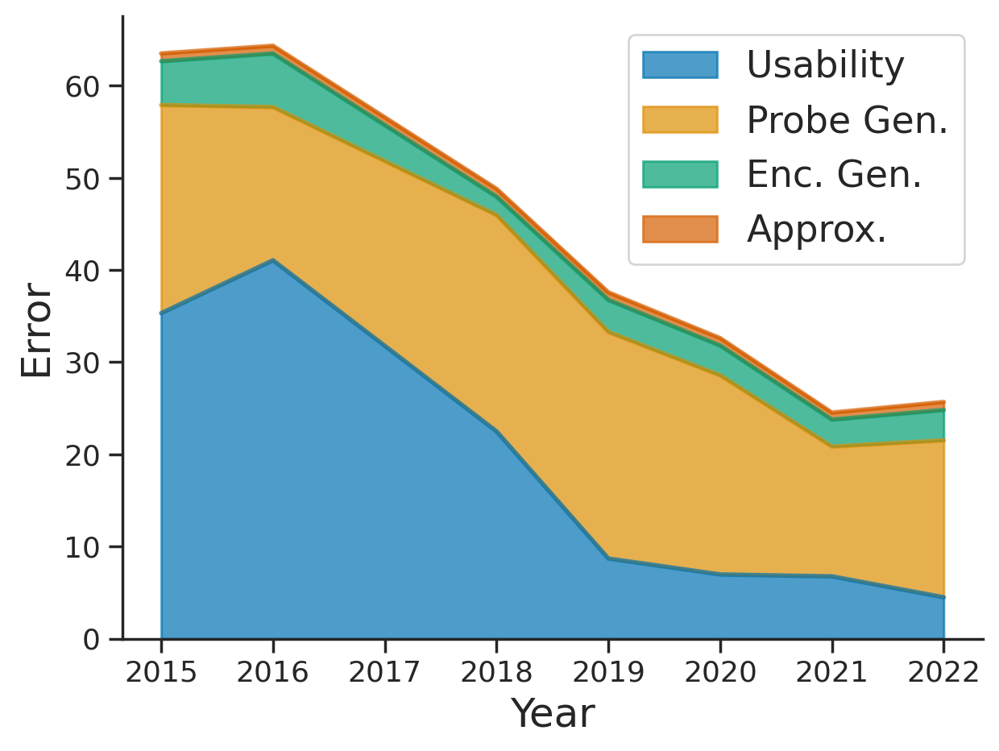

In [22]:
plot_trend(df, 
           is_min=False, 
           save_path="figures/trend_avg_all.pdf")

This was the mean over each model. For the min see the one in the main paper

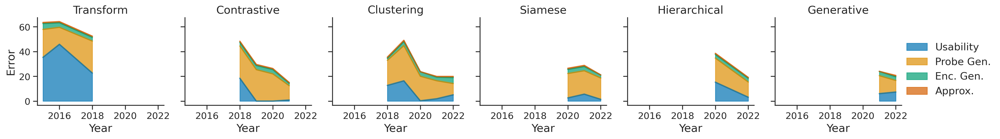

In [23]:
ordering = ["Transform","Contrastive","Clustering","Siamese","Hierarchical","Generative"]
plot_trend_split(df, 
                 "ssl_mode", ordering=ordering, is_min=True, 
                 save_path="figures/trend_mode.pdf")

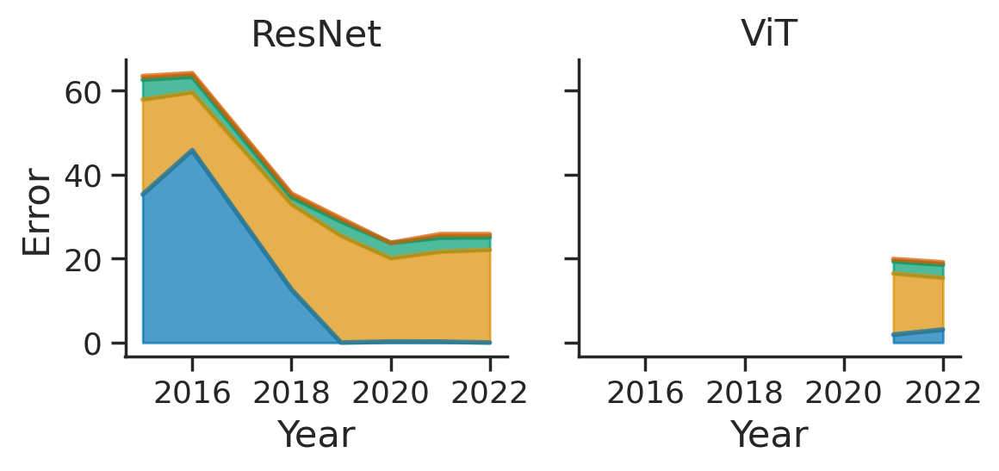

In [24]:
plot_trend_split(df_IN.query("family != 'convnext'"),  # convnext is only last year => remove
                 "family", 
                 ordering=None, is_min=True, is_legend=False,
                 save_path="figures/trend_arch.pdf",
                 pretty_renamer=dict(resnet="ResNet", vit="ViT")
                )


### Tradeoffs

First let us look at all tradeoffs

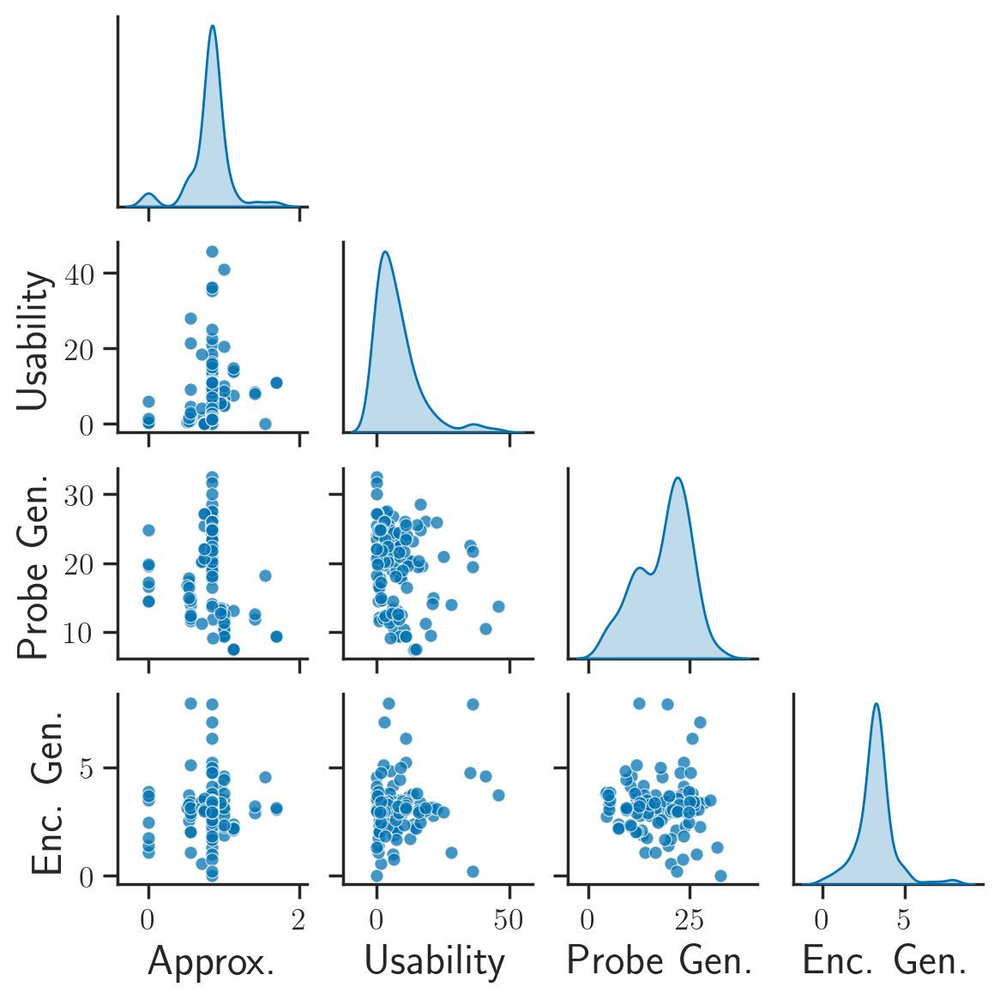

In [25]:
with plot_config(is_use_tex=True, font_scale=1.5, 
                 rc={'lines.linewidth': 2, 'font.family': 'sans-serif',
                     "ytick.labelsize": 13, "xtick.labelsize": 13}):
    g = sns.pairplot(df[COMPONENTS_ONLY].rename(columns=PRETTY_RENAMER), 
             height=1.5, 
             diag_kind="kde", 
             plot_kws=dict(s=30, alpha=0.75),
             corner=True)
    
    
    plt.savefig("figures/all_tradeoffs.pdf", bbox_inches='tight', pad_inches=0.2)

As discussed in the the paper there are no apparent tradeoofs, in particular we do not see anything special in the 

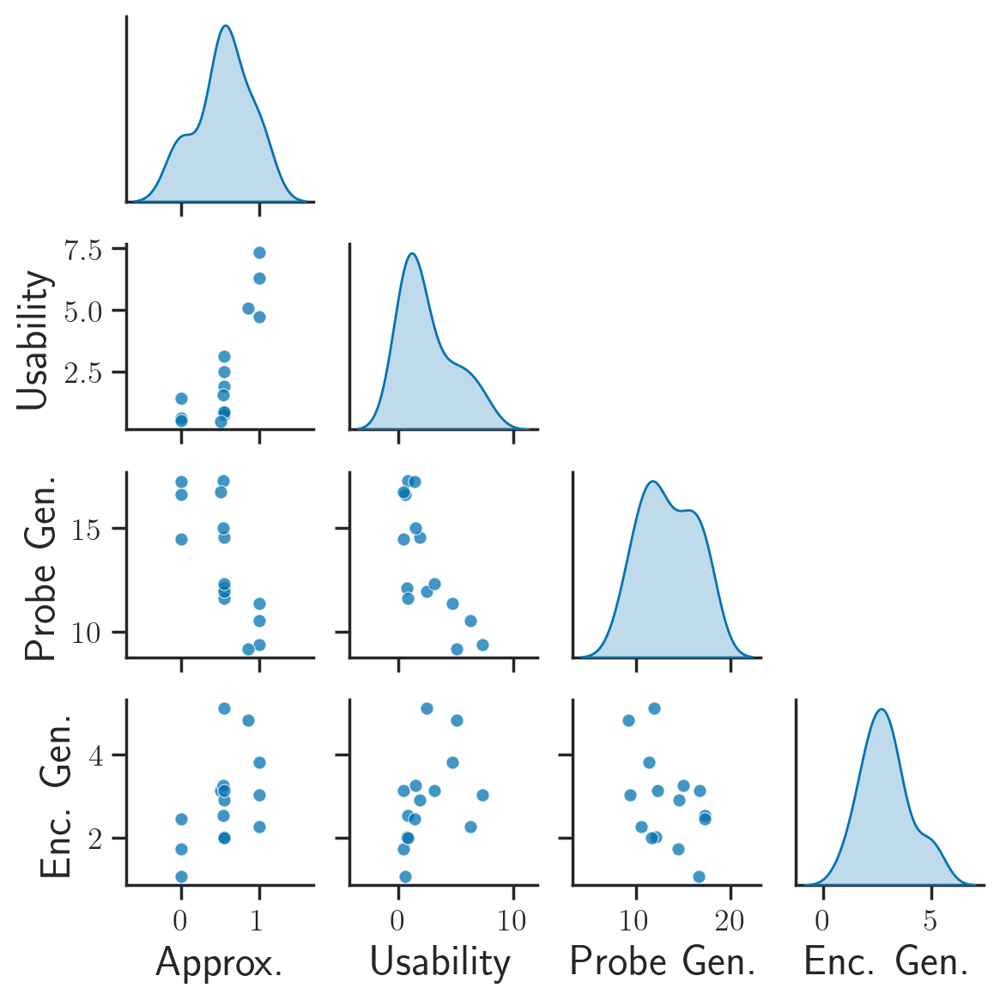

In [26]:

with plot_config(is_use_tex=True, font_scale=1.5, 
                 rc={'lines.linewidth': 2, 'font.family': 'sans-serif',
                     "ytick.labelsize": 13, "xtick.labelsize": 13}):
    g = sns.pairplot(filter_by_quantile(df, is_year=False, quantile=0.1)[COMPONENTS_ONLY].rename(columns=PRETTY_RENAMER), 
             height=1.5, 
             diag_kind="kde", 
             plot_kws=dict(s=30, alpha=0.75),
             corner=True)
    

now let us look at the best models for each years, as we did in the the main paper.
Note that we skip years < 2018 (as there are very few models for those years + they perform terribly so we cannot see differences in the newer models due to axis scaling)  and models for which we could estimate approximation error (isntead of those for which we set it to zero).

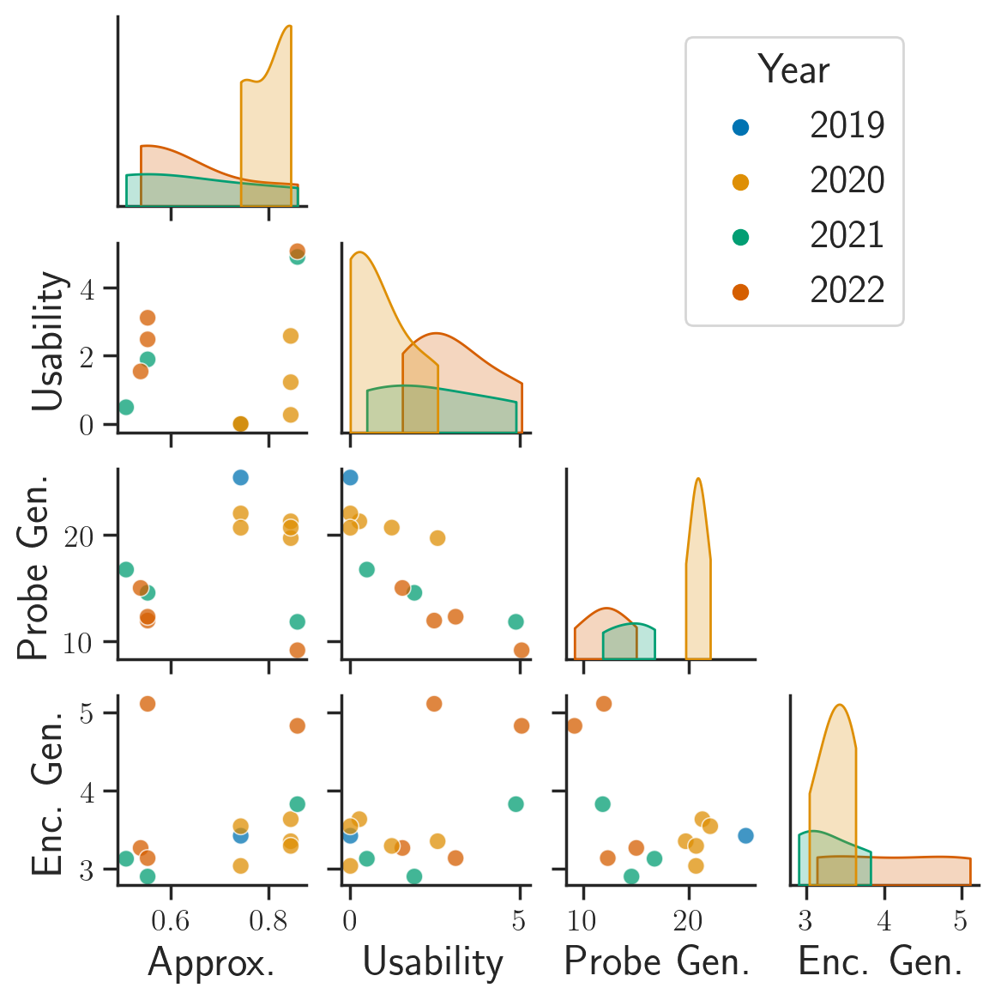

In [60]:

with plot_config(is_use_tex=True, font_scale=1.5, 
                 rc={'lines.linewidth': 2, 'font.family': 'sans-serif',
                     "ytick.labelsize": 13, "xtick.labelsize": 13}):
    
    data=filter_by_quantile(df_IN, is_year=True, quantile=0.1)[COMPONENTS_ONLY+["year"]].query("year >= 2019 & approx != 0").rename(columns=PRETTY_RENAMER)
    data["Year"] = data["Year"].astype("category")
    
    g = sns.pairplot(data,
            hue="Year",
                     height=1.5, 
             diag_kind="kde", 
             plot_kws=dict(s=50, alpha=0.75),
             corner=True,
                    diag_kws=dict(cut=0)
                    )
    sns.move_legend(g, "lower center", bbox_to_anchor=(.65, .65), ncol=1, frameon=True)

    
    plt.savefig("figures/all_tradeoffs_best.pdf", bbox_inches='tight', pad_inches=0.2)
    #g.set(xscale="log",yscale="log")
    

In [61]:
filter_by_quantile(df_IN, is_year=True, quantile=0.15)[COMPONENTS_ONLY+["year"]].rename(columns=PRETTY_RENAMER).query("Year >= 2022")


,Approx.,Usability,Probe Gen.,Enc. Gen.,Year
enc,,,,,
beitv2_vitb16_pt1k_ep300,0.996513,7.324338,9.359149,3.026000,2022
msn_vitb4_ep300,0.858748,5.066631,9.152622,4.827999,2022
msn_vitl7_ep200,0.552543,2.481878,11.949579,5.110000,2022
mugs_vitb16_ep400,0.996513,4.727096,11.370390,3.814000,2022
mugs_vitb16_ep400_extractb,0.538259,1.540861,15.022880,3.265999,2022
mugs_vitl16_ep250,0.552543,3.114895,12.312562,3.136000,2022


#### Initialized

In [62]:
data = df_init.copy()
data["architecture"] = data["architecture"].apply(lambda x: PRETTY_RENAMER(x))
data["family"] = data["family"].apply(lambda x: dict(vit="ViT", resnet="ResNet")[x])
data = data[~data.usability.isna()]
data = data .rename(columns=PRETTY_RENAMER).rename(columns={"Z Dim.": r"\textbf{Z Dim.}",
                                                 "Architecture": r"\textbf{Architecture}"})

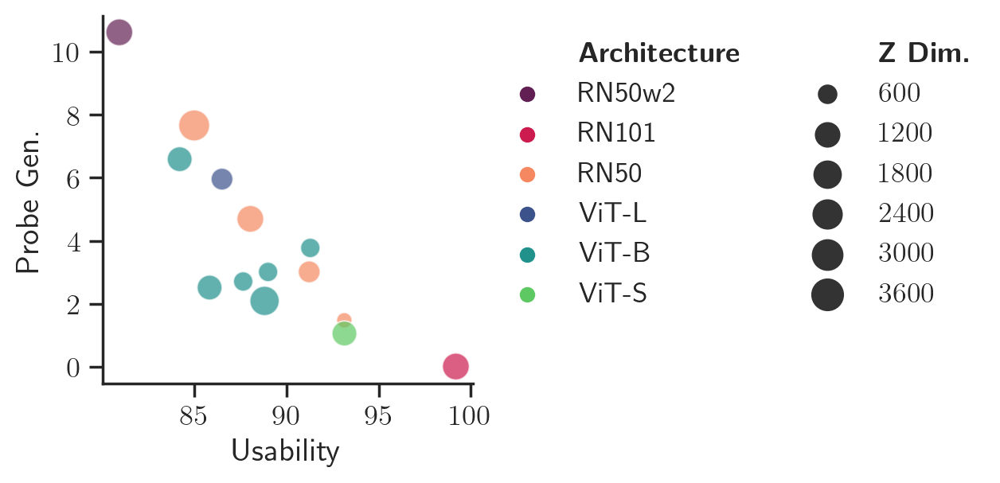

In [63]:
from matplotlib.colors import SymLogNorm

palette = sns.color_palette("rocket", n_colors=3) + sns.color_palette("viridis", n_colors=3)
with plot_config(is_use_tex=True, rc={"legend.fontsize": 13}, 
                 palette=palette, font_scale=1.2):
    fig, ax= plt.subplots(1,1, figsize=(3,3))
    g=sns.scatterplot(data=data, 
                      x="Usability", 
                      y="Probe Gen.", 
                      hue=r"\textbf{Architecture}",
                      hue_order=["RN50w2","RN101","RN50","ViT-L","ViT-B","ViT-S"],
                      #style="Family",
                      size=r"\textbf{Z Dim.}",
                      size_norm=SymLogNorm(linthresh=1,base=2),
                      sizes=(50, 200),
                      s=150, ax=ax, alpha=0.7)
    sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1),ncol=2, frameon=False)
    ax.yaxis.get_major_locator().set_params(integer=True)
    #g.set(xscale="log",yscale="log")
    
plt.savefig("figures/tradeoff_initialized.pdf", bbox_inches='tight', pad_inches=0.1)

### Alternative decomposition

In [64]:
%%capture capt
df_alternative, _ = load_df(traverse_path=["down","down","right"])
idx_alternative = ~df_alternative["probe_gen"].isna() # models for which you have the alternative decomposition
df_alternative = df_alternative[idx_alternative]

df_notalternative, _ = load_df()
df_notalternative = df_notalternative[idx_alternative]

In [65]:
df_alternative = df_alternative[["enc_gen","probe_gen"]].reset_index()
df_alternative["alternative"] = True
df_notalternative = df_notalternative[["enc_gen","probe_gen"]].reset_index()
df_notalternative["alternative"] = False

In [66]:
df_alt = pd.concat([df_alternative,df_notalternative])
df_alt["enc"] = df_alt["enc"].apply(lambda x: clean_model_name(x)[0])
df_alt = df_alt.query("enc != 'RotNet RN50'")

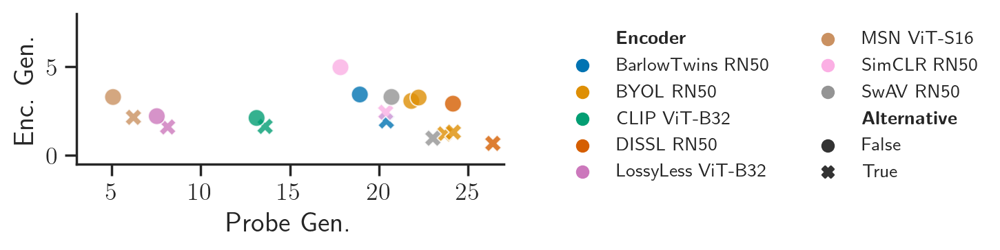

In [67]:
with plot_config(is_use_tex=True,  font_scale=1.2,
                 rc={'lines.linewidth': 2, 'font.family': 'sans-serif',
                     "ytick.labelsize": 13, "xtick.labelsize": 13, 
                     "legend.fontsize": 10}):
    fig, ax= plt.subplots(1,1, figsize=(4,4))
    
    data=data=df_alt.rename(columns=PRETTY_RENAMER
                           ).rename(columns=dict(Enc=r"\textbf{Encoder}",
                                                 Alternative=r"\textbf{Alternative}"))
    g=sns.scatterplot(data=data, 
                      y="Enc. Gen.", x="Probe Gen.", 
                      style=r"\textbf{Alternative}", hue=r"\textbf{Encoder}", 
                      s=80,  ax=ax, alpha=0.8)
    sns.move_legend(ax, "upper left", bbox_to_anchor=(1.1, 1),ncol=2, frameon=False)
    plt.axis('scaled')
    g.set(ylim=[-0.5,8],xlim=[3,27])
    
plt.savefig("figures/alternative.pdf", bbox_inches='tight', pad_inches=0.1)

### Evaluation

#### Correlations

Let us check the correlation between the actual performance and usability/probe gen

In [68]:
for m in CORE_METRICS:
    print(m)
    print("usability")
    compute_correlations(df["usability"], df[m], correlations=["Kendall"])
    print("gen")
    compute_correlations(df["probe_gen"], df[m], correlations=["Kendall"])
    print()


train_test
usability
Kendall correlation: 0.424 pvalue = 2.33e-13
gen
Kendall correlation: 0.417 pvalue = 8.22e-14

train-nperclass-30_test
usability
Kendall correlation: 0.420 pvalue = 1.55e-12
gen
Kendall correlation: 0.437 pvalue = 2.19e-14

train-balsbst-ntrain0.01_test
usability
Kendall correlation: 0.402 pvalue = 3.55e-12
gen
Kendall correlation: 0.445 pvalue = 1.64e-15

train-nperclass-5_test
usability
Kendall correlation: 0.383 pvalue = 3.40e-11
gen
Kendall correlation: 0.451 pvalue = 6.89e-16

train-nperclass-3_test
usability
Kendall correlation: 0.360 pvalue = 1.13e-09
gen
Kendall correlation: 0.458 pvalue = 1.02e-15



Let's see this visually

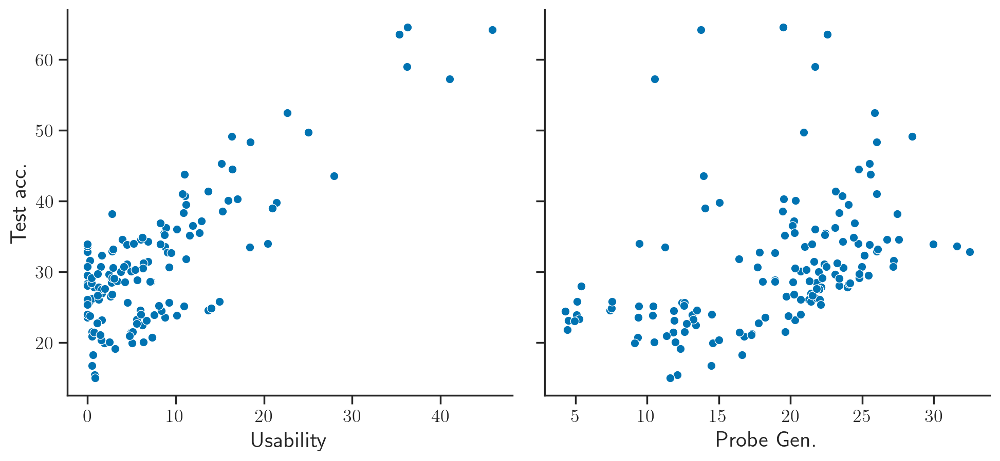

In [69]:
with plot_config(is_use_tex=True, font_scale=1.3, 
                 rc={'lines.linewidth': 2, 'font.family': 'sans-serif',
                     "ytick.labelsize": 13, "xtick.labelsize": 13, "legend.fontsize": 13}):
    
    data=melted_metrics.query("component in ['usability','probe_gen'] & metric in ['train_test']").copy()
    data.loc[:,"component"] = [PRETTY_RENAMER[c] for c in data["component"]]
    g=sns.relplot(data=data.rename(columns=PRETTY_RENAMER), 
                    x="Value", 
                    y="Metric Value", 
                    #hue="non_vary", 
                    col="Component", 
                    #col="Metric",
                    kind="scatter",
                    facet_kws={'sharey': True, 'sharex': False})
    g.set(ylabel="Test acc.").set_titles("{col_name}")
    
    for ax in g.axes.flatten():
        ax.set_xlabel(ax.get_title())
        ax.set_title('')

In [ ]:
with plot_config(is_use_tex=True, font_scale=1.3, 
                 rc={'lines.linewidth': 2, 'font.family': 'sans-serif',
                     "ytick.labelsize": 13, "xtick.labelsize": 13, "legend.fontsize": 13}):
    
    data=melted_metrics.query("component in ['usability','probe_gen'] & metric in ['train-nperclass-3_test']").copy()
    data.loc[:,"component"] = [PRETTY_RENAMER[c] for c in data["component"]]
    g=sns.relplot(data=data.rename(columns=PRETTY_RENAMER), 
                    x="Value", 
                    y="Metric Value", 
                    #hue="non_vary", 
                    col="Component", 
                    #col="Metric",
                    kind="scatter",
                    facet_kws={'sharey': True, 'sharex': False})
    g.set(ylabel=r"3-shot test acc.").set_titles("{col_name}")
    
    for ax in g.axes.flatten():
        ax.set_xlabel(ax.get_title())
        ax.set_title('')

Note that usability is still correlated with performance.
This is not true if we consider the difference between 100 and few shot:

In [ ]:
df_nona = df[~df[COMPONENTS].isna().any(axis=1)].copy()
for m in CORE_METRICS[1:]:
    print(m)
    
    for c in ["usability","probe_gen"]:
        print(c)
        compute_correlations(df_nona[c], 
                             df_nona[m] - df_nona["train_test"] , 
                             correlations=["Kendall"])
    print()

In [ ]:
with plot_config(is_use_tex=True, font_scale=1.3, 
                 rc={'lines.linewidth': 2, 'font.family': 'sans-serif',
                     "ytick.labelsize": 13, "xtick.labelsize": 13, "legend.fontsize": 13}):
    
    data=melted_metrics.query("component in ['usability','probe_gen'] & metric in ['delta-100%-3shot']").copy()
    data.loc[:,"component"] = [PRETTY_RENAMER[c] for c in data["component"]]
    g=sns.relplot(data=data.rename(columns=PRETTY_RENAMER), 
                    x="Value", 
                    y="Metric Value", 
                    #hue="non_vary", 
                    col="Component", 
                    #col="Metric",
                    kind="scatter",
                    facet_kws={'sharey': True, 'sharex': False})
    g.set(ylabel="Delta sample eff.").set_titles("{col_name}")
    
    for ax in g.axes.flatten():
        ax.set_xlabel(ax.get_title())
        ax.set_title('')

#### Scaling laws

In [ ]:
data = melt(df_nona.reset_index(), components=CORE_METRICS, var_name="metrics")
data["n_samples"] = [get_sample_size(m) for m in data["metrics"]]
data = data[~data["value"].isna()]
data["n_params_probe"] = data["z_dim"]*1000
print(f"Standard deviation to explain: {data['value'].std():.2f}")

data.groupby("metrics")['value'].std().to_frame().T

In [ ]:
test_kwargs = dict(#test_mask = data["metrics"].isin(["train-nperclass-5_test","train-nperclass-30_test"]),
                   test_size=2*len(data["enc"].unique()),
                    stratify="enc"
                  )

##### Baselines

First let us check the standard model independent scaling law
$$
\begin{aligned}
\mathrm{perf}(n) &= \mathrm{irr} + \frac{C}{n^{\alpha}} \\
\log(\mathrm{perf}(n) - \mathrm{irr}) &=  \gamma - \alpha \log(n) \\
\end{aligned}
$$


In [ ]:
model,_ = fit_scaling_law(data, ["np.log(n_samples)"], target="value")
print(model.summary().tables[1])

In [ ]:
_ = scalinglaw(data, independent_vars = ["n_samples"], **test_kwargs) 

Now probe dependent
$$
\mathrm{perf}(n,p) = \mathrm{irr} + \frac{C}{n^{\alpha}} +  \frac{K}{p^{\beta}}
$$
where $p$ is the number of parameters

In [ ]:

_ = scalinglaw(data, 
               f_pred = f_pred_param,
               possible_params = ["Irr", "C", "alpha","K","beta"],
               independent_vars = ["n_samples","n_params_probe"],
               **test_kwargs
              ) 

We see that, interestingly, the number of parameters (or equivalently the z_dim) is not useful to predict performance.

Now encoder dependent
$$
\mathrm{perf}(n,p,e) = \mathrm{irr(e)} + \frac{C(e)}{n^{\alpha(e)}}  +  \frac{K}{p^{\beta}}
$$


In [ ]:
_ = scalinglaw(data, 
               model_col="architecture",
               f_pred = f_pred_param,
               model_dep=["Irr", "C", "alpha"],
               possible_params = ["Irr", "C", "alpha","K","beta"],
               independent_vars = ["n_samples","n_params_probe"],
               **test_kwargs
              ) 

In [ ]:
data["objective"] = data["objective"].replace("clip+eb","lossyless")
_ = scalinglaw(data, 
               model_col="objective",
               f_pred = f_pred_param,
               model_dep=["Irr", "C", "alpha"],
               possible_params = ["Irr", "C", "alpha","K","beta"],
               independent_vars = ["n_samples","n_params_probe"],
               **test_kwargs
              ) 

We see that the gains are much better (unsurprisingly).
Now let us try to use the agg risk as the irreducible error.

Now as a lower bound on what we can achieve let us consider fitting a different scaling law for each of all the models

In [ ]:
_ = scalinglaw(data, 
               model_col="enc",
               max_nfev=10000, 
               f_pred = f_pred_param,
               model_dep=["Irr", "C", "alpha"],
               possible_params = ["Irr", "C", "alpha","K","beta"],
               independent_vars = ["n_samples","n_params_probe"],
               **test_kwargs
              ) 

We see that the RMSE when fitting a scaling law for each of the model is really good, which basically shows that the log-log linear assumption is realatively good.

##### Using our risk decomposition

For the derivation, note that we know by definition (besides empirical) that:
$$\mathrm{perf}(n,m) = \mathrm{usability}(n,m) + \mathrm{approx}(n,m) +  \mathrm{enc\_gen}(m)  +  \mathrm{probe\_gen}(n,m)$$ 
where $n$ is the number of samples and $m$ is the encoder. 

Now by standard scaling laws we also have (note that there is no irreducible error as this is taken into account in the approx /usability/enc_gen => gen gap is 0 if all data) :
$$ \mathrm{probe\_gen}(n,m) = \frac{C(m)}{n^{\alpha(m)}}$$ 

The issue is we do not want to fit $C(m)$ and $\alpha(m)$ for each model. It has been shown empirically that alpha typically takes similar values so we'll fix it to be the same for all models. For $C(m)$ we can use the fact that we know $\mathrm{probe\_gen}(N)$ where $N$ is ImageNet training size. We thus have:
$$ \mathrm{probe\_gen}(n,m)n^{\alpha}  =  C(m) = \mathrm{probe\_gen}(N,m)N^{\alpha}$$
so 

$$
\begin{aligned}
\mathrm{perf}(n,m) &= \mathrm{usability} + \mathrm{approx} +  \mathrm{enc\_gen}  +  \mathrm{probe\_gen}(n,m) \\
&= \mathrm{usability} + \mathrm{approx} +  \mathrm{enc\_gen}  +   \mathrm{probe\_gen}(N,m) \left(\frac{N}{n}\right)^{\alpha} 
\end{aligned}
$$


In [ ]:
N = data["n_samples"].max() -  50000 # n trainig samples for probe gen

In [ ]:
def f_pred_our1(params, data, model_var):
    return (data["enc_gen"] + data["train_train"]  + data["probe_gen"] * ( N/params["n_samples"])**params["alpha"]).clip(0,100)

kwargs = dict(f_pred = f_pred_our1, possible_params = [ "alpha"], independent_vars = ["n_samples"])
_ = scalinglaw(data,
               **test_kwargs,
               **kwargs) 

with io.capture_output() as captured:
    results_1param = scalinglaw(data, **kwargs) 

Note that we thus get the following equation, which we see fits better all the models despite using a single parameter.

$$\mathrm{perf}   =  \mathrm{usability} + \mathrm{approx} +  \mathrm{enc\_gen} +   \mathrm{probe\_gen}*\frac{N}{\mathrm{n\_samples}}^{\color{blue}{0.16}}  $$

In [ ]:
results = results_1param
with plot_config(is_use_tex=True, font_scale=1.3, 
                 rc={'lines.linewidth': 2, 'font.family': 'sans-serif',
                     "ytick.labelsize": 13, "xtick.labelsize": 13}):
    fig, ax= plt.subplots(1,1, figsize=(4,4))
    
    tmp=pd.DataFrame({"Predicted perf.":results.eval(),
                     "Actual perf.":results.data,
                     "Samples":(data["n_samples"]/1000).astype("int").astype("category")})
    g=sns.scatterplot(tmp, x="Predicted perf.", y="Actual perf.", ax=ax, hue="Samples",alpha=0.5,
                   palette="viridis")#, hue_norm=SymLogNorm(linthresh=1,base=2),)
    #sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
    #g.set(xscale="log", yscale="log")
    
    #ax.set_xlim([0,100])
    #ax.set_ylim([0,100])
    ax.axis("square")
    #plt.xscale('log')
    #plt.yscale('log')
    
    # plot x=y
    lims = [np.min([ax.get_xlim(), ax.get_ylim()]),  np.max([ax.get_xlim(), ax.get_ylim()])]
    ax.plot(lims, lims, 'k--', alpha=0.5, zorder=0, linewidth=1)

We can further improve the model by noticing that the importance of usability changes also depending on the number of samples.

In [ ]:
def f_pred_our2b(params, data, model_var):
    return (data["enc_gen"] +data["approx"]+ (1-params["B"])*data["usability"]+ (params["B"] *data["usability"]  + data["probe_gen"]) * ( N/params["n_samples"])**params["alpha"]).clip(0,100)

kwargs = dict(f_pred = f_pred_our2b, possible_params = [ "alpha","B"], independent_vars = ["n_samples"])
_ = scalinglaw(data,
               **test_kwargs,
               **kwargs) 

with io.capture_output() as captured:
    results_2param = scalinglaw(data, **kwargs) 

We indeed see that the performance improves

In [ ]:
results = results_2param
with plot_config(is_use_tex=True, font_scale=1.3, 
                 rc={'lines.linewidth': 2, 'font.family': 'sans-serif',
                     "ytick.labelsize": 13, "xtick.labelsize": 13}):
    fig, ax= plt.subplots(1,1, figsize=(4,4))
    
    tmp=pd.DataFrame({"Predicted perf.":results.eval(),
                     "Actual perf.":results.data,
                     "Samples":(data["n_samples"]/1000).astype("int").astype("category")})
    g=sns.scatterplot(tmp, x="Predicted perf.", y="Actual perf.", ax=ax, hue="Samples",alpha=0.5,
                   palette="viridis")#, hue_norm=SymLogNorm(linthresh=1,base=2),)
    #sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
    #g.set(xscale="log", yscale="log")
    
    #ax.set_xlim([0,100])
    #ax.set_ylim([0,100])
    ax.axis("square")
    #plt.xscale('log')
    #plt.yscale('log')
    
    # plot x=y
    lims = [np.min([ax.get_xlim(), ax.get_ylim()]),  np.max([ax.get_xlim(), ax.get_ylim()])]
    ax.plot(lims, lims, 'k--', alpha=0.5, zorder=0, linewidth=1)
    
plt.savefig("figures/evaluation_scalinglaw.pdf", bbox_inches='tight', pad_inches=0.1)

What about if you specifically hold out some number of samples?

In [ ]:
kwargs = dict(f_pred = f_pred_our2b, possible_params = [ "alpha","B"], independent_vars = ["n_samples"])
_ = scalinglaw(data,
               test_mask = data["metrics"].isin(["train-nperclass-5_test","train-nperclass-30_test"]),
               **kwargs) 

One important advantage of our method is that we can actually predict the performance of completely new models which is not possible if you need to fit a scaling law for each model. 
For example let's predict the performance of all models from 2022 or all contrastive methods.

In [ ]:
kwargs = dict(f_pred = f_pred_our2b, possible_params = [ "alpha","B"], independent_vars = ["n_samples"])
_ = scalinglaw(data,
               test_mask = data["ssl_mode"].isin(["contrastive"]),
               **kwargs) 

In [ ]:
kwargs = dict(f_pred = f_pred_our2b, possible_params = [ "alpha","B"], independent_vars = ["n_samples"])
_ = scalinglaw(data,
               test_mask = data["year"].isin([2022]),
               **kwargs) 

### Statistics

<span style="color:red">
TODO: 
</span>

- double check those results
- make nicer plot
- put in appcs
- reload all the results now that should be done


Checking effect of statistics on performance in few shot and many shot + comapre / analuse effect with decomposition

In [12]:
NOAUG_STATISTICS = ['train_vars', 'train_alignment', 'train_uniformity', "train_nc1norm"]
FIXEDAUG_STATISTICS = ['trainaug_vars', 'trainaug_alignment', 'train_uniformity', "trainaug_nc1norm"]
TEST_STATISTICS = [s.replace("train","test") for s in CORE_STATISTICS]
TEST_FIXEDAUG_STATISTICS = [s.replace("train","test") for s in FIXEDAUG_STATISTICS]
TEST_NOAUG_STATISTICS = [s.replace("train","test") for s in NOAUG_STATISTICS]

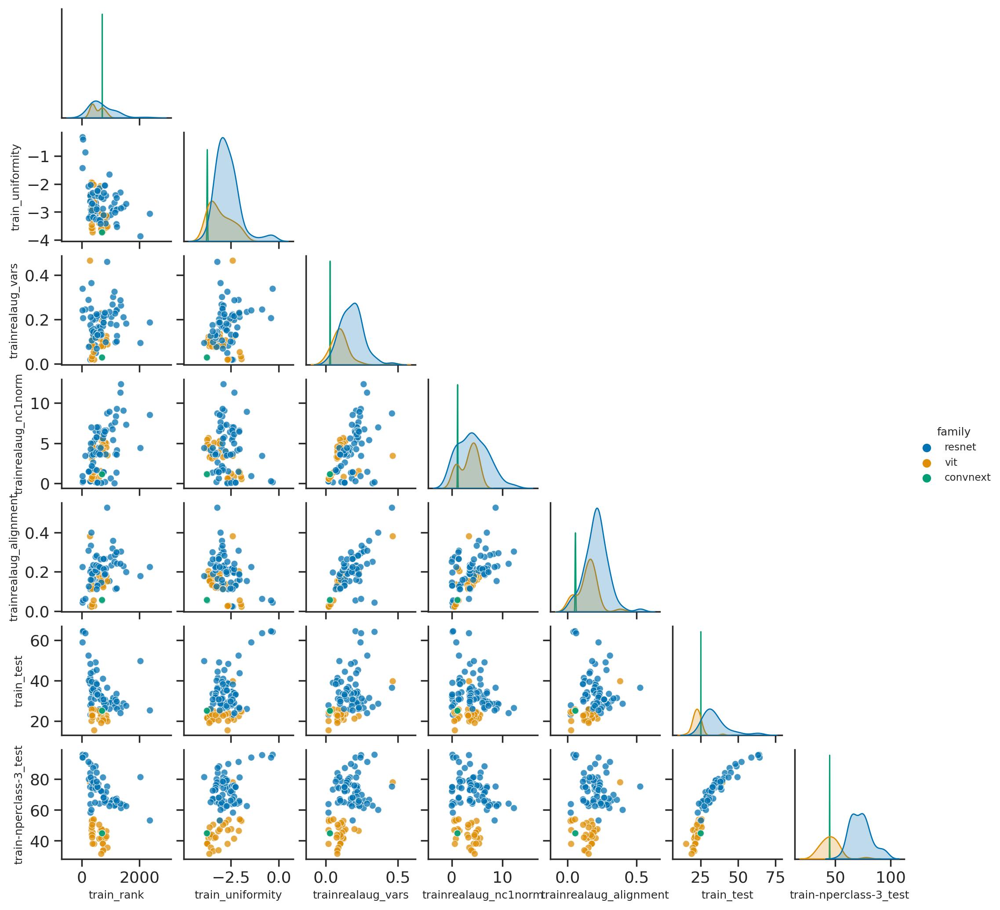

In [95]:
with plot_config(is_use_tex=False, font_scale=0.75, 
                 rc={'lines.linewidth': 2, 'font.family': 'sans-serif',
                     "ytick.labelsize": 13, "xtick.labelsize": 13}):
    g = sns.pairplot(df.query("trainrealaug_vars < 0.5")[CORE_STATISTICS+["train_test"]+['train-nperclass-3_test']+["family"]], 
             height=1.5, 
             diag_kind="kde", 
             plot_kws=dict(s=30, alpha=0.75),
             hue="family",
             corner=True)

In [172]:
model = smf.ols(formula="train_test ~ np.log(train_rank) + train_uniformity + trainrealaug_alignment ", data=df.query("architecture_exact == 'resnet50'")).fit()
print("R-squared",model.rsquared)
model.summary().tables[1]
# np.log(train_vars) or train_alignment has huge effect

R-squared 0.5810280016363828


,coef,std err,t,P>|t|,[0.025,0.975]
Intercept,93.2712,6.084,15.330,0.000,81.124,105.419
np.log(train_rank),-9.5017,1.203,-7.895,0.000,-11.904,-7.099
train_uniformity,-0.5109,1.536,-0.333,0.740,-3.577,2.555
trainrealaug_alignment,4.3906,8.200,0.535,0.594,-11.980,20.761


In [173]:
model = smf.ols(formula="train_test ~ train_uniformity + trainrealaug_alignment", data=df.query("architecture_exact == 'resnet50'")).fit()
print("R-squared",model.rsquared)
model.summary().tables[1]


R-squared 0.1853098322681901


,coef,std err,t,P>|t|,[0.025,0.975]
Intercept,51.8653,4.269,12.149,0.000,43.344,60.386
train_uniformity,6.0004,1.793,3.346,0.001,2.421,9.579
trainrealaug_alignment,-1.6767,11.298,-0.148,0.882,-24.228,20.875


We see that uniformity is actually a little related to performance but all of it is explained by train_rank when looking at resnet50. Now let's look for general families

In [147]:
model = smf.ols(formula="train_test ~ np.log(train_rank) + train_uniformity + trainrealaug_alignment", data=df).fit()
print("R-squared",model.rsquared)
model.summary().tables[1]


R-squared 0.4894413823925209


,coef,std err,t,P>|t|,[0.025,0.975]
Intercept,81.5715,6.125,13.318,0.000,69.433,93.710
np.log(train_rank),-7.1693,1.190,-6.027,0.000,-9.527,-4.812
train_uniformity,4.1390,1.118,3.701,0.000,1.923,6.355
trainrealaug_alignment,33.9027,7.054,4.806,0.000,19.922,47.883


We see that uniformity and alignment are not really helpful to predict performance. One possibility is because we did no use normalized representations for downstream tasks. Let's look at what happens when you use normalized representations. First let us see whether it performs better:

In [ ]:
%%capture
df_norm, _ = load_df(pred = 'torch_linear_hypopt_unit')
df_norm = df_norm.query("ssl_mode != 'initialized' & ssl_mode != 'supervised'")

In [110]:
delta_norm = df_norm["train_test"].to_frame().join(df["train_test"], rsuffix="_norm")
(delta_norm["train_test"] - delta_norm["train_test_norm"]).apply(["count","mean","sem","min","max","median"])

count     22.000000
mean      -0.526273
sem        0.309073
min       -6.426001
max        1.119995
median    -0.317998
dtype: float64

We see that normalized representations perform statistically significantly worst in downstream tasks

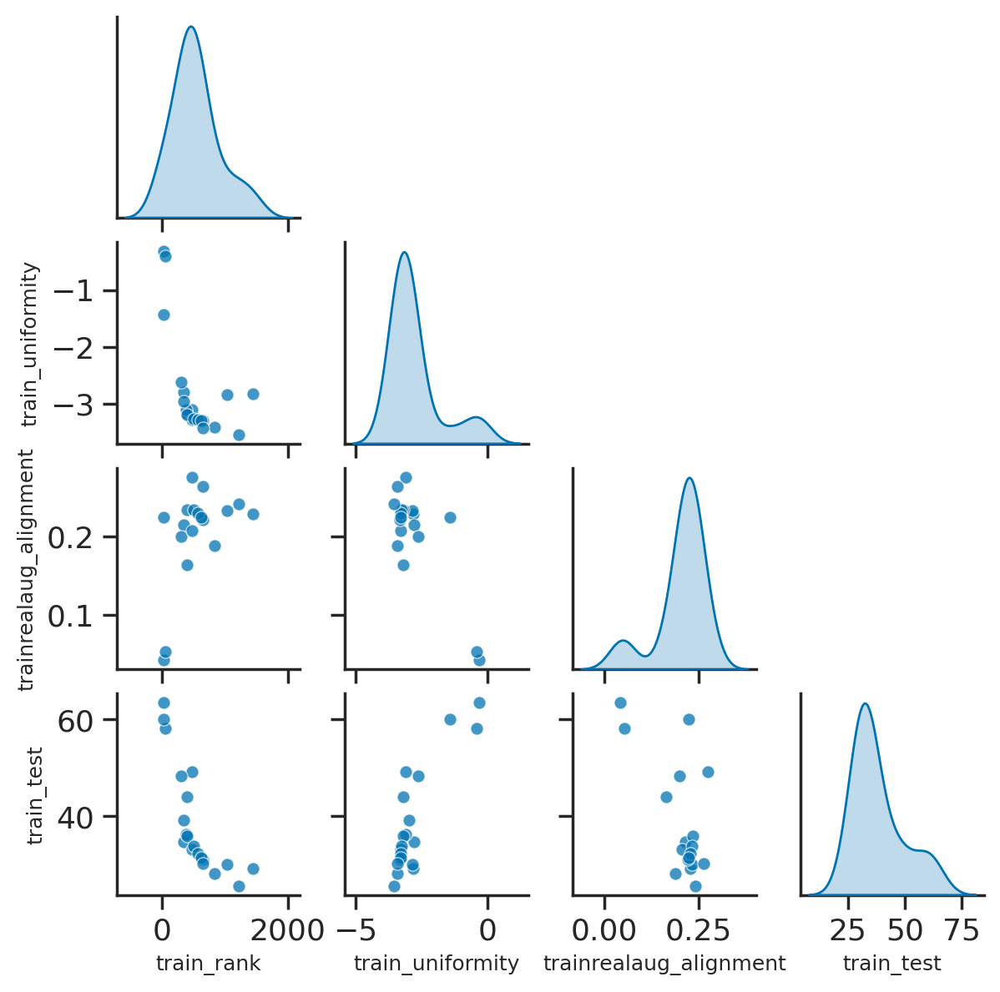

In [111]:
with plot_config(is_use_tex=False, font_scale=0.75, 
                 rc={'lines.linewidth': 2, 'font.family': 'sans-serif',
                     "ytick.labelsize": 13, "xtick.labelsize": 13}):
    g = sns.pairplot(df_norm[["train_rank","train_uniformity","trainrealaug_alignment"]+["train_test"]], 
             height=1.5, 
             diag_kind="kde", 
             plot_kws=dict(s=30, alpha=0.75),
             corner=True)
    #g.set(xscale="log")
    #g.set(yscale="log")

In [186]:
model = smf.ols(formula="np.log(train_test) ~ np.log(train_rank) + train_uniformity + trainrealaug_alignment ", data=df_norm).fit()
print("R-squared",model.rsquared)
model.summary().tables[1]
# + np.log(trainrealaug_nc1norm) is pretty useful
# + np.log(train_vars) or train_alignment are really useful but that's cheating

R-squared 0.822005145869035


kurtosistest only valid for n>=20 ... continuing anyway, n=18


,coef,std err,t,P>|t|,[0.025,0.975]
Intercept,4.8991,0.235,20.807,0.000,4.394,5.404
np.log(train_rank),-0.2100,0.063,-3.327,0.005,-0.345,-0.075
train_uniformity,0.0386,0.091,0.423,0.679,-0.157,0.235
trainrealaug_alignment,0.3680,0.906,0.406,0.691,-1.576,2.312


In [113]:
model = smf.ols(formula="np.log(train_test) ~ train_uniformity + trainrealaug_alignment", data=df_norm).fit()
print("R-squared",model.rsquared)
model.summary().tables[1]


R-squared 0.6812678169411078


kurtosistest only valid for n>=20 ... continuing anyway, n=18


,coef,std err,t,P>|t|,[0.025,0.975]
Intercept,4.2056,0.142,29.707,0.000,3.904,4.507
train_uniformity,0.2789,0.072,3.858,0.002,0.125,0.433
trainrealaug_alignment,0.8847,1.154,0.766,0.455,-1.576,3.345


We see here that uniformity is much more useful to predict performance than in the unormalized case, but again everything is explained by train rank.

Note that surprisingly we have that alignment is not useful to predict performance (although alignment inside an actual class is --- see below). This is very surprising

**Surprisingly alignment is not useful** . Potential issues:
- alignment is only useful if looking at erm
- bug

In [187]:
model = smf.ols(formula="np.log(train_test) ~ np.log(train_rank) + train_uniformity + trainrealaug_alignment + train_alignment", data=df_norm).fit()
print("R-squared",model.rsquared)
model.summary().tables[1]
# + np.log(trainrealaug_nc1norm) is pretty useful
# + np.log(train_vars) or train_alignment are really useful but that's cheating

R-squared 0.9738171712664316


kurtosistest only valid for n>=20 ... continuing anyway, n=18


,coef,std err,t,P>|t|,[0.025,0.975]
Intercept,4.8849,0.094,52.118,0.000,4.682,5.087
np.log(train_rank),-0.2163,0.025,-8.605,0.000,-0.271,-0.162
train_uniformity,0.4354,0.058,7.456,0.000,0.309,0.562
trainrealaug_alignment,-0.7501,0.383,-1.958,0.072,-1.578,0.077
train_alignment,1.3612,0.157,8.682,0.000,1.022,1.700


### Probes trained with aug

todo

### Effect of hyperparameters

first let us train a model that will be able to predict the 

In [18]:
onehot_features = ["family","is_official","pretraining_data","ssl_mode"]
features = ["nviews","batch_size","year","n_augmentations","z_dim","n_parameters","patch_size"]
objectives=["agg_risk"]

# resnet can be seen as having of kernel_size
inp = melted.copy()
inp["patch_size"] = inp.apply(lambda row: (4 if row["family"] == "convnext" else 7) if pd.isna(row["patch_size"]) else row["patch_size"], axis=1)
df["patch_size"] = df.apply(lambda row: (4 if row["family"] == "convnext" else 7) if pd.isna(row["patch_size"]) else row["patch_size"], axis=1)
inp["finetuning_data"] = inp["finetuning_data"].fillna("Na")

In [22]:
df_pre = preprocess_features(df)
X,y=prepare_sklearn(df_pre, target=objectives[0])

In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`


#### Dimensionality

<span style="color:red">
TODO: 
</span>

- add general impact with xgboost
- make nicer plot
- put in appcs


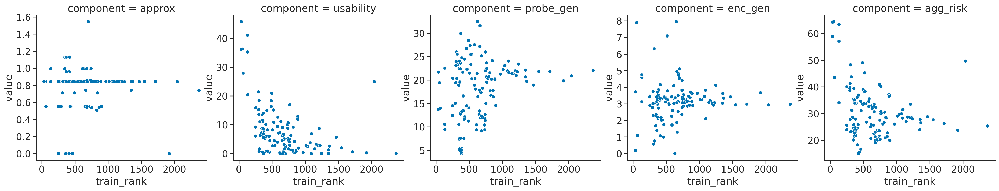

In [71]:
with plot_config():
    g=sns.relplot(data=melted, x="train_rank", y="value", 
                  col="component", facet_kws={'sharey': False})
    #g.set(xscale="log")
    #g.set(yscale="log")

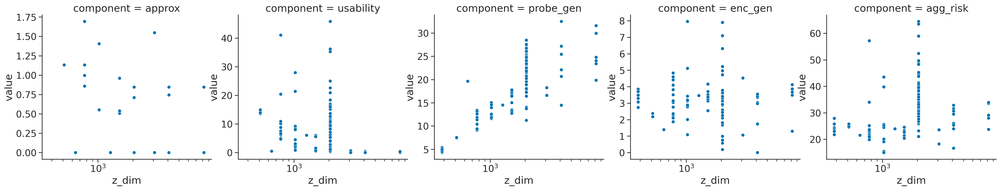

In [73]:
with plot_config():
    g=sns.relplot(data=melted, x="z_dim", y="value", col="component", facet_kws={'sharey': False, 'sharex': True})
    g.set(xscale="log")

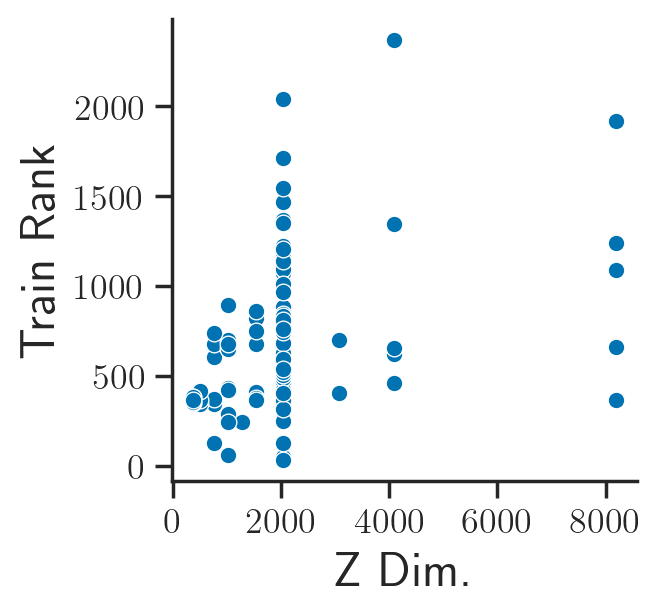

In [74]:
with plot_config(is_use_tex=True, font_scale=1.5, 
                 rc={'lines.linewidth': 2, 'font.family': 'sans-serif',
                     "ytick.labelsize": 13, "xtick.labelsize": 13, "legend.fontsize": 13}):
    fig, ax= plt.subplots(1,1, figsize=(3,3))
    
    data=df.rename(columns=PRETTY_RENAMER)
    #data["Year"] = data["Year"].astype("category")
    sns.scatterplot(data=data, x="Z Dim.", y="Train Rank", ax=ax)#, hue="Year"

In [75]:
df_zdim = melt(get_only_vary(df, ["z_dim"], core_params), components=COMPONENTS)

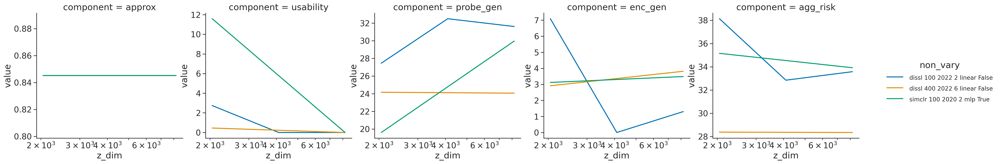

In [76]:


with plot_config():
    g = sns.relplot(data=df_zdim, x="z_dim", y="value", hue="non_vary", col="component", kind="line",
                    facet_kws={'sharey': False})
    plt.setp(g._legend.get_texts(), fontsize=12)
    g.set(xscale="log")
    #g.set(yscale="log")
    #g.set_xticklabels(rotation=30)

In [77]:
ols_summary(df_zdim, "z_dim", condition=['non_vary', 'np.log({treatment})'], 
            f_outcome="log_delta", objectives=COMPONENTS)

omni_normtest is not valid with less than 8 observations; 7 samples were given.
omni_normtest is not valid with less than 8 observations; 7 samples were given.
omni_normtest is not valid with less than 8 observations; 7 samples were given.


                                  usability                                   
Dep. Variable:          np.log(value)   R-squared:                       0.818
Model:                            OLS   Adj. R-squared:                  0.635
Method:                 Least Squares   F-statistic:                     4.486
Date:                Thu, 08 Dec 2022   Prob (F-statistic):              0.125
Time:                        15:23:42   Log-Likelihood:                -8.1423
No. Observations:                   7   AIC:                             24.28
Df Residuals:                       3   BIC:                             24.07
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
rmse: 2.3823585926935653, delta: -0.1
                                                coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

omni_normtest is not valid with less than 8 observations; 7 samples were given.
omni_normtest is not valid with less than 8 observations; 6 samples were given.
omni_normtest is not valid with less than 8 observations; 7 samples were given.


In [41]:
df_zlayer = get_only_vary(df, ["z_dim","z_layer"], core_params, drop_cols=["pretraining_data"])
melted_zlayer = melt(df_zlayer, components=COMPONENTS)
#df_zlayer = df_zlayer[df_zlayer.family == "vit"]



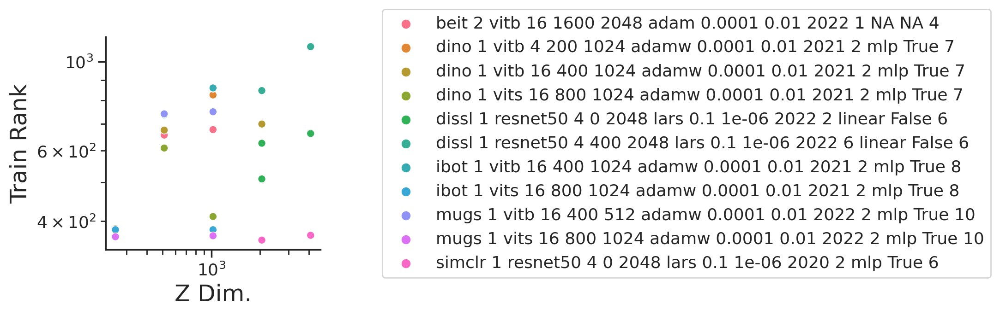

In [42]:
with plot_config(is_use_tex=False, font_scale=1.5, 
                 rc={'lines.linewidth': 2, 'font.family': 'sans-serif',
                     "ytick.labelsize": 13, "xtick.labelsize": 13, "legend.fontsize": 13}):
    fig, ax= plt.subplots(1,1, figsize=(3,3))
    
    data=df_zlayer.rename(columns=PRETTY_RENAMER)
    data["Z Layer"] = data["Z Layer"].astype("category")
    g=sns.scatterplot(data=data, x="Z Dim.", y="Train Rank", ax=ax, hue="Non Vary")
    g.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
    g.set(xscale="log")
    g.set(yscale="log")

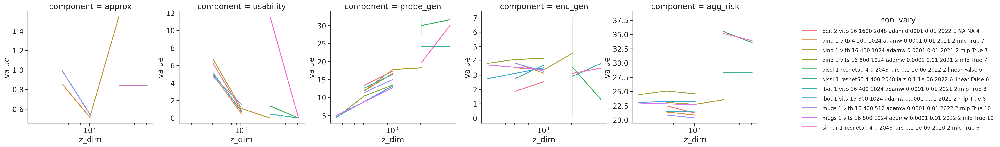

In [43]:
with plot_config():
    g = sns.relplot(data=melted_zlayer, x="z_dim", y="value", hue="non_vary", col="component", kind="line",
                    facet_kws={'sharey': False})
    plt.setp(g._legend.get_texts(), fontsize=12)
    g.set(xscale="log")
    
    #g.set_xticklabels(rotation=30)

In [44]:
ols_summary(melted_zlayer, "z_dim", condition=['non_vary', 'np.log({treatment})'], 
            f_outcome="", objectives=COMPONENTS, is_short=True)

usability
rmse: nan, delta: 0


,Coef.,Std.Err.,t,P>|t|,[0.025,0.975]
np.log(z_dim),-5.619353,0.716213,-7.845925,5.978172e-08,-7.100952,-4.137753



probe_gen
rmse: 1.2190559763157953, delta: 0


,Coef.,Std.Err.,t,P>|t|,[0.025,0.975]
np.log(z_dim),5.768145,0.444995,12.962259,4.680906e-14,4.860571,6.67572


Now let's look at all simultaneously by controlling the correct variables.

In [38]:
treatment = "z_dim" 
g,to_condition = causal_graph(treatment)
ols_summary(inp, treatment, objectives=COMPONENTS, condition=to_condition+["np.log({treatment})"], is_short=True)

usability
rmse: nan, delta: 0


,Coef.,Std.Err.,t,P>|t|,[0.025,0.975]
np.log(z_dim),-4.834559,1.290431,-3.74647,0.000282,-7.390654,-2.278465



probe_gen
rmse: 2.568778811349735, delta: 0


,Coef.,Std.Err.,t,P>|t|,[0.025,0.975]
np.log(z_dim),4.939434,0.719356,6.866471,2.809896e-10,3.515627,6.36324



### Effect of type of method

Now let's consider the effect of the type of method

**Hypothesis** ISSL showed that contrastive, distillation and clustering all optimize nearly the right objective and can be made correct with minor differences, so we hypothesize that usability for them must be good.

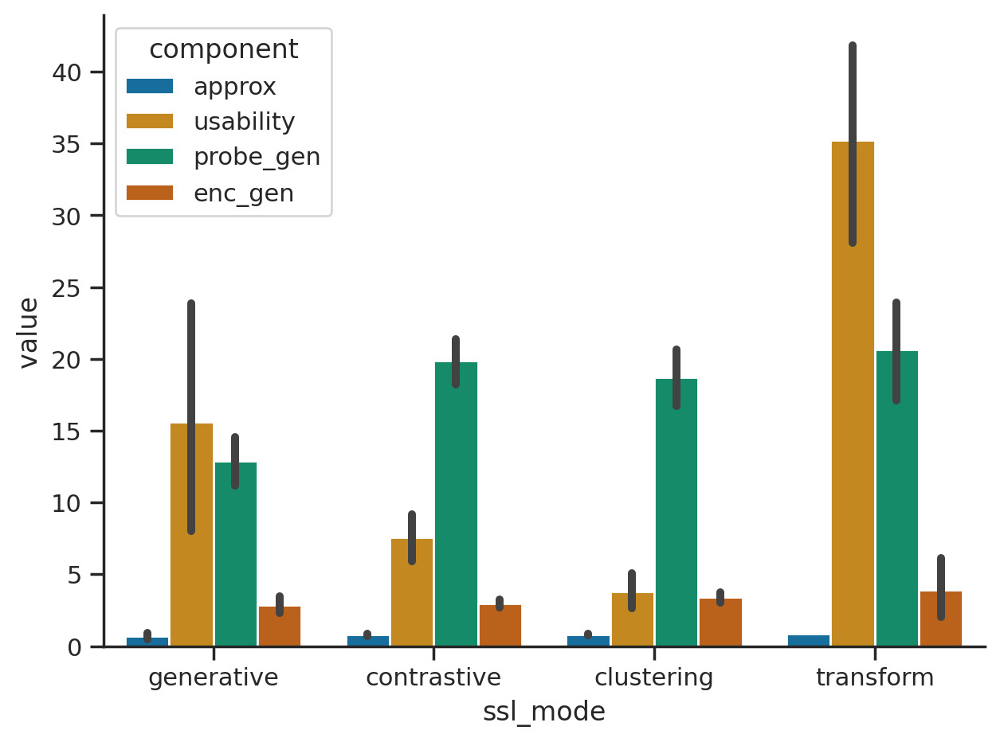

In [82]:
with plot_config(font_scale=1):
    sns.barplot(data=melted_onlyComp[melted_onlyComp["ssl_mode"].isin(["generative", "clustering", "contrastive", "transform"])], 
                x="ssl_mode", y="value", hue="component")
    plt.tight_layout()

In [83]:
vary = ["ssl_mode", "architecture", "nviews", "epochs", "z_dim",'img_size'] #,"batch_size"
df_mode = melt(get_only_vary(df, ["ssl_mode"], vary), components=COMPONENTS)

In [84]:
# g = sns.catplot(data=df_mode, x="component", y="value", 
#                     hue="ssl_mode", 
#                     row="non_vary",
#                     #col="component", 
#                     kind="bar",
#                     #facet_kws={'sharey': False},
#                    )

Mean of empty slice
All-NaN slice encountered
Mean of empty slice
All-NaN slice encountered


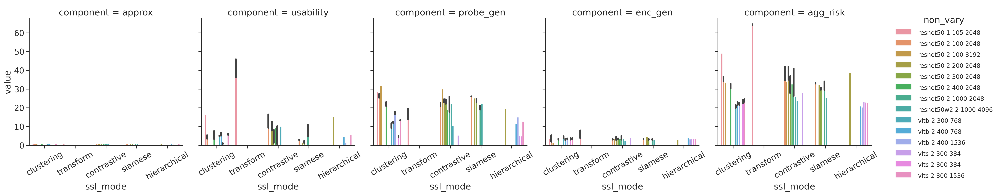

In [85]:
with plot_config():
    g = sns.catplot(data=df_mode, x="ssl_mode", y="value", hue="non_vary", col="component", 
                    kind="bar",
                    facet_kws={'sharey': False})
    plt.setp(g._legend.get_texts(), fontsize=12)
    g.set_xticklabels(rotation=30)
    #g.set(yscale="log")
    #g.set(xscale="log")
    #sns.move_legend(g, "lower center", bbox_to_anchor=(0., 0.5, 0.7, 1.102))

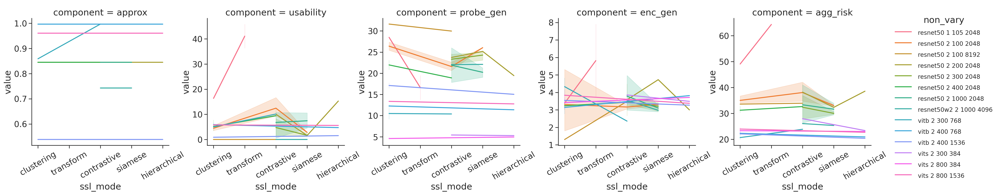

In [86]:
with plot_config():
    g = sns.relplot(data=df_mode, x="ssl_mode", y="value", hue="non_vary", col="component", 
                    kind="line",
                    facet_kws={'sharey': False})
    plt.setp(g._legend.get_texts(), fontsize=12)
    g.set_xticklabels(rotation=30)
    #g.set(yscale="log")
    #g.set(xscale="log")
    #sns.move_legend(g, "lower center", bbox_to_anchor=(0., 0.5, 0.7, 1.102))

**TODO** remove error bars by filtering models

In [45]:
treatment = "ssl_mode" 
g,to_condition = causal_graph(treatment)
ols_summary(inp, treatment, objectives=COMPONENTS, condition=to_condition+["{treatment}"], is_short=True)

usability
rmse: nan, delta: 0


,Coef.,Std.Err.,t,P>|t|,[0.025,0.975]
ssl_mode[T.contrastive],0.660070,1.398616,0.471945,0.637860,-2.110320,3.430460
ssl_mode[T.generative],4.534426,3.107129,1.459362,0.147192,-1.620199,10.689052
ssl_mode[T.hierarchical],4.128342,2.624609,1.572936,0.118481,-1.070504,9.327188
ssl_mode[T.siamese],0.598842,1.720460,0.348071,0.728423,-2.809058,4.006741
ssl_mode[T.transform],8.035802,3.834321,2.095756,0.038298,0.440749,15.630855



probe_gen
rmse: 2.568778811349732, delta: 0


,Coef.,Std.Err.,t,P>|t|,[0.025,0.975]
ssl_mode[T.contrastive],-1.408788,0.802505,-1.755487,0.081645,-2.997171,0.179595
ssl_mode[T.generative],0.410904,1.794643,0.228961,0.819276,-3.141198,3.963006
ssl_mode[T.hierarchical],-2.038474,1.365177,-1.493195,0.137926,-4.740541,0.663593
ssl_mode[T.siamese],-0.708083,0.996405,-0.710638,0.478643,-2.680248,1.264082
ssl_mode[T.transform],-4.564944,2.256503,-2.023017,0.045222,-9.031196,-0.098692



enc_gen
rmse: 0.9666563568620549, delta: 0


,Coef.,Std.Err.,t,P>|t|,[0.025,0.975]
ssl_mode[T.contrastive],0.096348,0.301991,0.319044,0.750230,-0.501376,0.694072
ssl_mode[T.generative],-1.800421,0.675342,-2.665941,0.008700,-3.137111,-0.463731
ssl_mode[T.hierarchical],-0.046708,0.513729,-0.090919,0.927704,-1.063522,0.970106
ssl_mode[T.siamese],-0.033145,0.374957,-0.088397,0.929704,-0.775290,0.709000
ssl_mode[T.transform],0.186284,0.849144,0.219378,0.826716,-1.494410,1.866978


### Effect of projection 

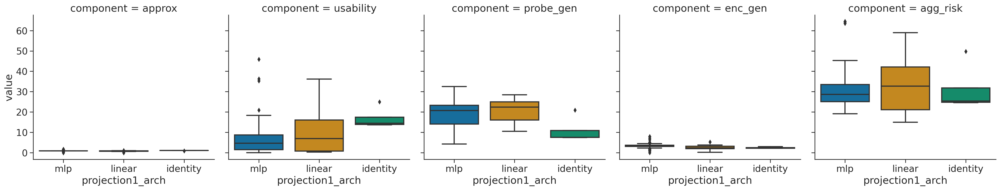

In [93]:
with plot_config():
    g=sns.catplot(data=melted, x="projection1_arch", y="value", col="component", facet_kws={'sharey': False}, kind="box")
#g.set(xscale="log")

In [102]:
df_proj = melt(get_only_vary(df, ["projection_same","projection1_arch","projection2_arch"], core_params), components=COMPONENTS)

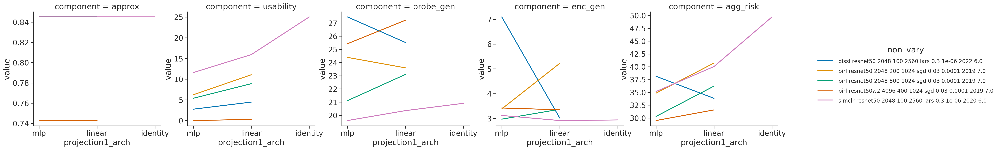

In [106]:


with plot_config():
    g = sns.relplot(data=df_proj, x="projection1_arch", y="value", hue="non_vary", col="component", kind="line",
                    facet_kws={'sharey': False})
    plt.setp(g._legend.get_texts(), fontsize=12)
    #g.set(xscale="log")
    #g.set(yscale="log")
    #g.set_xticklabels(rotation=30)

**todo** distinguish between teacher and student projection head

In [51]:
treatment = "projection1_arch" 
g,to_condition = causal_graph(treatment)
ols_summary(inp[~inp["projection1_arch"].isna()], 
            treatment, objectives=COMPONENTS, condition=to_condition+["{treatment}"], is_short=True)

usability
rmse: nan, delta: 0


,Coef.,Std.Err.,t,P>|t|,[0.025,0.975]
projection1_arch[T.linear],-8.066209,2.622955,-3.075237,0.002681,-13.267044,-2.865373
projection1_arch[T.mlp],-9.538828,2.684951,-3.552701,0.000573,-14.862590,-4.215066



agg_risk
rmse: 2.31336629437641, delta: 0


,Coef.,Std.Err.,t,P>|t|,[0.025,0.975]
projection1_arch[T.linear],-3.589388,1.937170,-1.852903,0.066483,-7.426906,0.248131
projection1_arch[T.mlp],-7.379363,1.985123,-3.717332,0.000314,-11.311877,-3.446848


In [53]:
treatment = "projection2_arch" 
g,to_condition = causal_graph(treatment)
ols_summary(inp[~inp["projection2_arch"].isna()], 
            treatment, objectives=COMPONENTS, condition=to_condition+["{treatment}"], is_short=True)

usability
rmse: nan, delta: 0


,Coef.,Std.Err.,t,P>|t|,[0.025,0.975]
projection2_arch[T.linear],-8.729308,2.457045,-3.552766,0.000586,-13.604620,-3.853997
projection2_arch[T.mlp],-10.670792,2.664976,-4.004085,0.000120,-15.958683,-5.382902



agg_risk
rmse: 1.9707183356706994, delta: 0


,Coef.,Std.Err.,t,P>|t|,[0.025,0.975]
projection2_arch[T.linear],-5.448585,1.638332,-3.325691,1.205715e-03,-8.696042,-2.201127
projection2_arch[T.mlp],-10.100952,1.783721,-5.662853,1.243173e-07,-13.636597,-6.565307


### Effect of negatives 

In [59]:
curr = melted[melted.n_negatives.notnull() & (melted.ssl_mode == "contrastive")].copy()
curr.n_negatives = curr.n_negatives.astype(float)

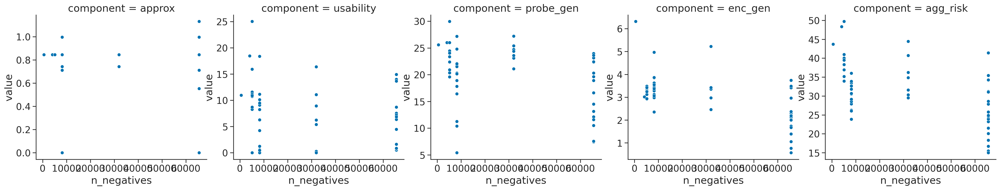

In [108]:
with plot_config():
    g=sns.relplot(data=curr, 
                  x="n_negatives", y="value", col="component", facet_kws={'sharey': False}, kind="scatter")
#g.set(xscale="log")

In [65]:
curr = inp[inp.n_negatives.notnull() & (inp.ssl_mode == "contrastive")].copy()
curr.n_negatives = curr.n_negatives.astype(float)

In [68]:
treatment = "n_negatives" 
g,to_condition = causal_graph(treatment)
ols_summary(curr, treatment, objectives=COMPONENTS, condition=to_condition+["np.log({treatment})"], is_short=True)

enc_gen
rmse: 0.5557397147542588, delta: 0


,Coef.,Std.Err.,t,P>|t|,[0.025,0.975]
np.log(n_negatives),-0.658258,0.153575,-4.286228,0.00013,-0.969723,-0.346793


#### Classes 

In [115]:
curr = melted[melted.n_classes.notnull()].copy()
curr.n_classes = curr.n_classes.astype(float)

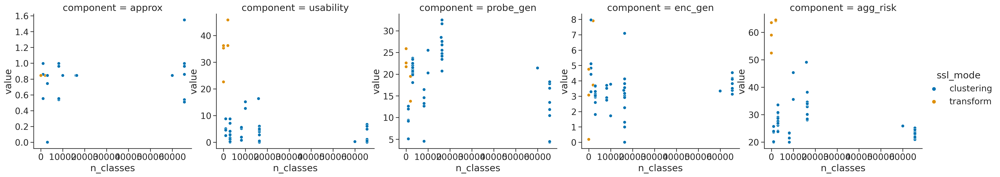

In [117]:
with plot_config():
    g=sns.relplot(data=curr, 
                  x="n_classes", y="value", col="component", facet_kws={'sharey': False}, kind="scatter", hue="ssl_mode")
#g.set(xscale="log")

In [15]:
curr = inp[inp.n_classes.notnull()].copy()
curr.n_classes = curr.n_classes.astype(float)

In [18]:
treatment = "n_classes" 
g,to_condition = causal_graph(treatment)
ols_summary(curr, treatment, objectives=COMPONENTS, condition=to_condition+["np.log({treatment})"], is_short=True)

#### Augmentations

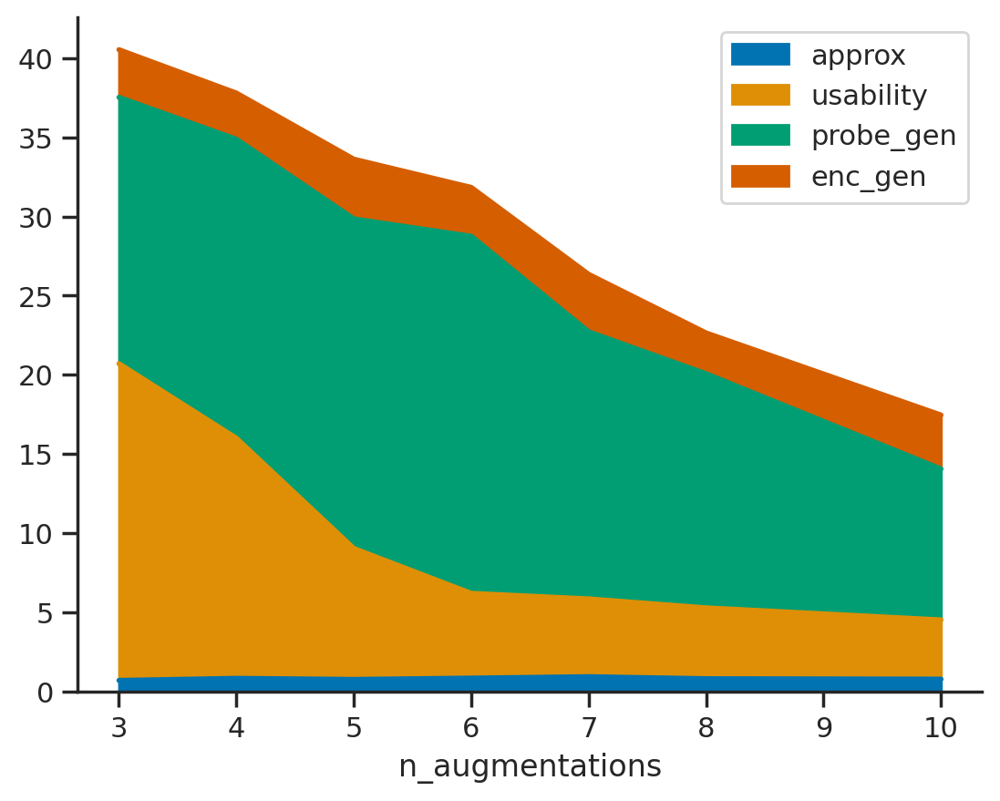

In [27]:
min_counts = 3
with plot_config(font_scale=1):
    curr_df = copy.deepcopy(df.query("pretraining_data == 'ImageNet-1K' ")[COMPONENTS_ONLY + ["n_augmentations"]])
    counts = curr_df["n_augmentations"].value_counts()
    select = curr_df["n_augmentations"].isin(counts[counts >= min_counts].index)
    curr_df[select].groupby("n_augmentations").mean().plot.area()

Very clear monotonic improvement. Surprisingly it's the USABILITY that improves with n_augmentations at least at the begining. AFter a sufficient number (6) it's the probe gen as expecxted.

Of course in reality not all augmentations have the same value. Now let's look at the improvement from each augmentation separately. This takes into account all the different models

In [109]:
comp = COMPONENTS_ONLY # COMPONENTS
IS_PLOT_ONLY_SIGNIFICANT = True

deltas = dict()

for a in AUGMENTATIONS[:-2]:
    min_counts = 5
    curr_df = copy.deepcopy(df.query("pretraining_data == 'ImageNet-1K' ")[COMPONENTS_ONLY + [a]])
    counts = curr_df[a].value_counts()
    to_select = counts[counts >= min_counts].index
    select = curr_df[a].isin(to_select)
    if len(to_select) > 0:
        try:
            mean = curr_df[select].groupby(a).mean()
            sem = curr_df[select].groupby(a).sem()
            deltas[a] = pd.DataFrame(dict(mean=mean.loc[0] - mean.loc[1],
                                                         sem=(sem.loc[0]**2 + sem.loc[1]**2)**0.5))
        except:
            pass

deltas = pd.concat(deltas).reset_index()
deltas.columns = ["aug","components","mean","sem"]
to_select = (deltas["mean"].abs() - deltas["sem"].abs())>0
if IS_PLOT_ONLY_SIGNIFICANT:
    deltas = deltas[to_select]
#deltas.set_index(["aug","components"])


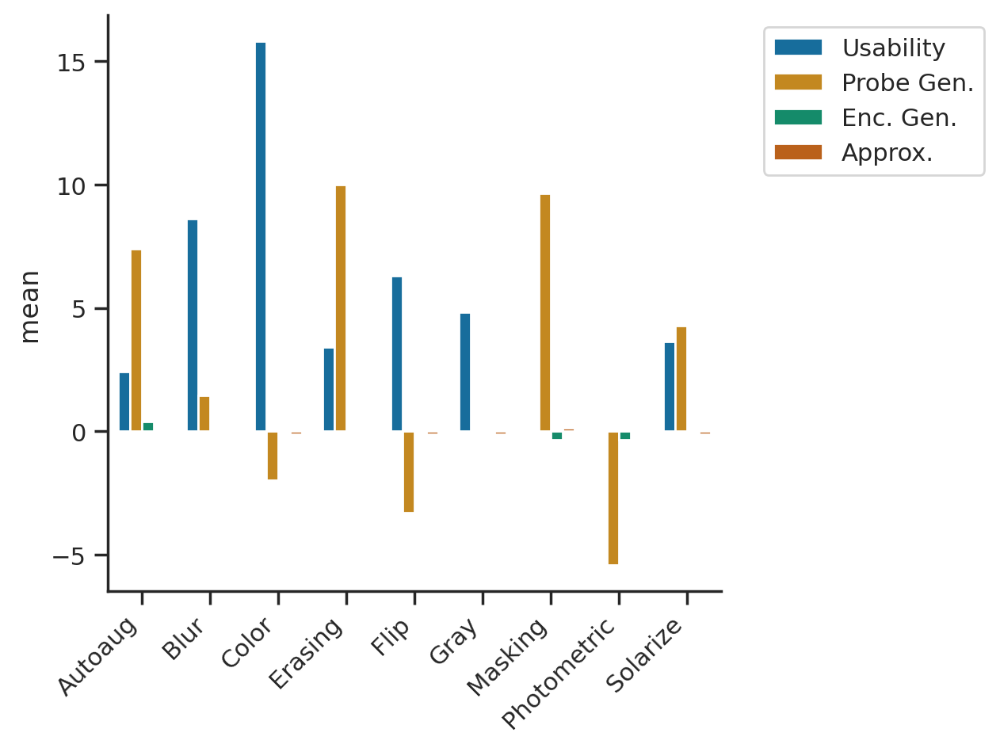

In [110]:
deltas[["aug","components"]] = deltas[["aug","components"]].applymap(PRETTY_RENAMER)

with plot_config(font_scale=1):
    ax = sns.barplot(data=deltas, 
                x="aug", y="mean", hue="components", width=0.7)
    #plt.setp(g._legend.get_texts(), fontsize=12)
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 45, ha="right")
    ax.set(xlabel=None)
    plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
    plt.tight_layout()

We see again that usability is the main gain with erasing / masking / autoagument that improve also a lot the probe generalization. One issue with the above is that it doesn't take into account confounders. E.g. masking is a recent type of augmentations that is only currently used with ViT. Let's look now at only consiering the differences between models that have the same architecture / z_dim / epochs. Note that we are not only selecting methods that have the same ojective, as this doesn't seem to make a huge difference and there are very few methods with the same objective that change augmentations => not much statistical power

In [115]:
comp = COMPONENTS_ONLY # COMPONENTS
IS_PLOT_ONLY_SIGNIFICANT = True

deltas = dict()
for i in range(len(AUGMENTATIONS)-2):
    df_aug = get_only_vary(df, AUGMENTATIONS[i:i+1], 
                                AUGMENTATIONS[i:-2]+['architecture','patch_size','z_dim','is_aug_invariant',"epochs",'nviews','finetuning_data',"pretraining_data"])
    mean = df_aug.groupby(AUGMENTATIONS[i]).mean(numeric_only=True)[comp]
    sem = df_aug.groupby(AUGMENTATIONS[i]).sem(numeric_only=True)[comp]
    try:
        deltas[AUGMENTATIONS[i]] = pd.DataFrame(dict(mean=mean.loc[0] - mean.loc[1],
                                        sem=(sem.loc[0]**2 + sem.loc[1]**2)**0.5))
    except:
        pass

deltas = pd.concat(deltas).reset_index()
deltas.columns = ["aug","components","mean","sem"]
to_select = (deltas["mean"].abs() - deltas["sem"].abs())>0
if IS_PLOT_ONLY_SIGNIFICANT:
    deltas = deltas[to_select]
#deltas.set_index(["aug","components"])

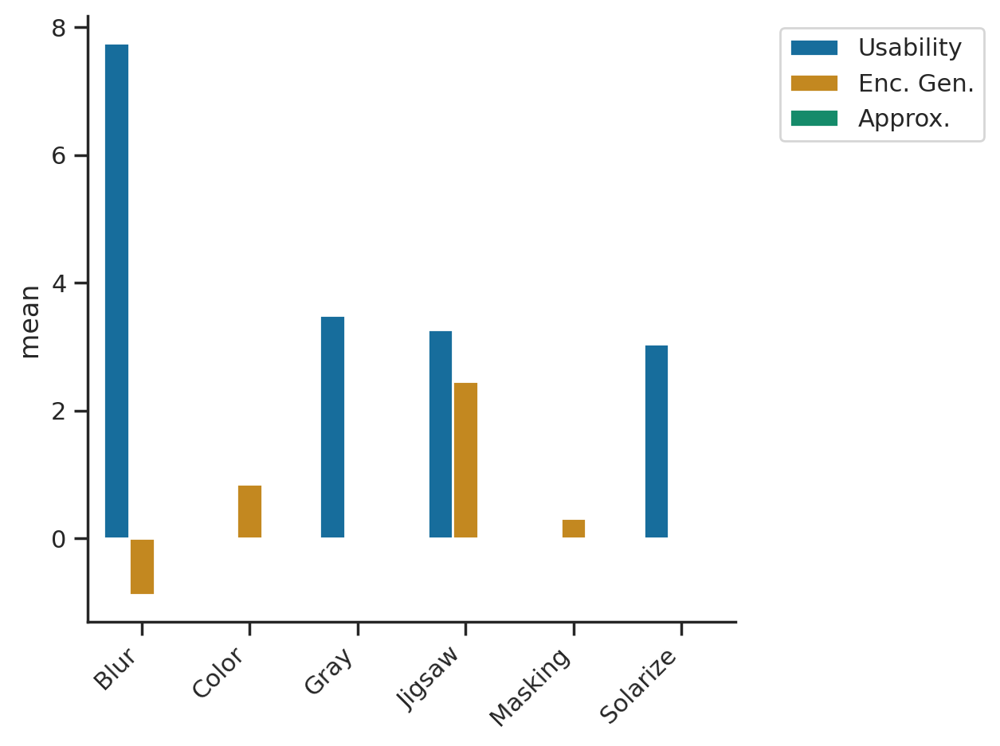

In [116]:
deltas[["aug","components"]] = deltas[["aug","components"]].applymap(PRETTY_RENAMER)

with plot_config(font_scale=1):
    ax = sns.barplot(data=deltas, #yerr="sem",
                x="aug", y="mean", hue="components", width=0.7)
    #plt.setp(g._legend.get_texts(), fontsize=12)
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 45, ha="right")
    ax.set(xlabel=None)
    plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
    plt.tight_layout()

You really see that using augmentations when there are few surprisingly improves USABILITY. 

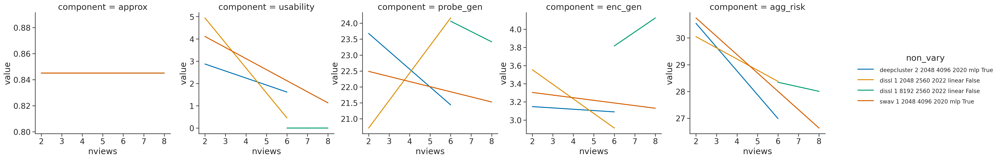

In [120]:
df_nviews = melt(get_only_vary(df, ["nviews"], core_params), 
               components=COMPONENTS)
df_nviews["nviews"] = df_nviews["nviews"].astype(int)

with plot_config():
    g = sns.relplot(data=df_nviews, x="nviews", y="value", hue="non_vary", col="component", kind="line",
                    facet_kws={'sharey': False})
    plt.setp(g._legend.get_texts(), fontsize=12)
    #g.set(xscale="log")
    #g.set(yscale="log")
    #g.set_xticklabels(rotation=30)

number of multi view improves both probe gen and usability

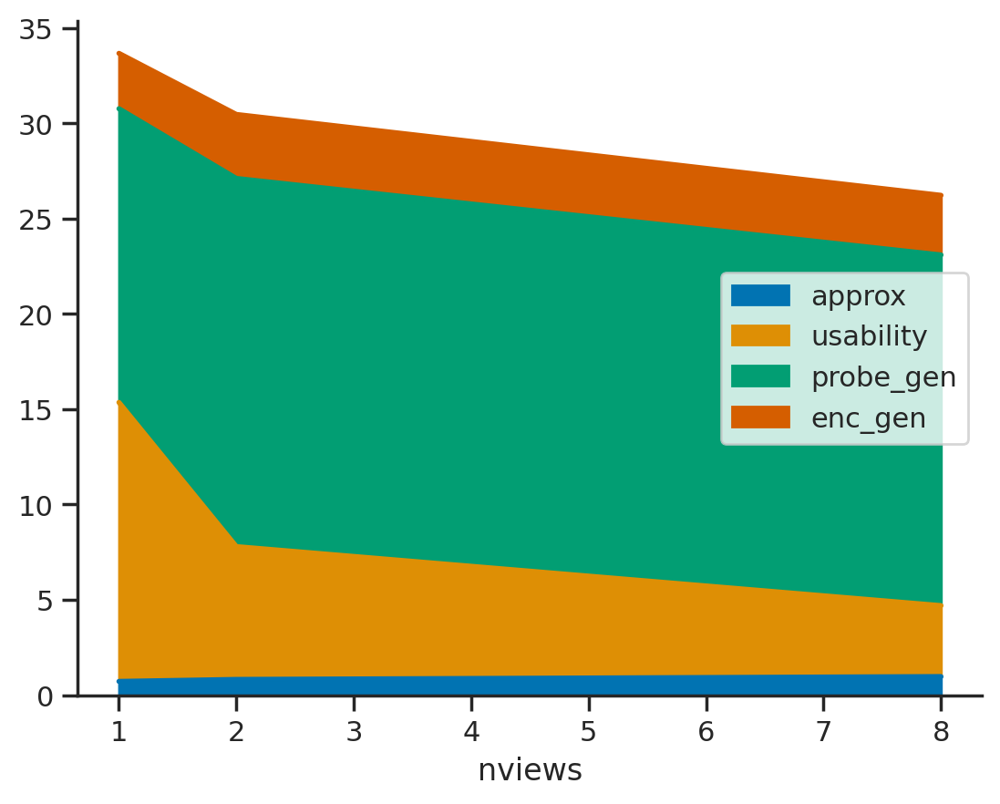

In [121]:
min_counts = 5
with plot_config(font_scale=1):
    curr_df = copy.deepcopy(df.query("pretraining_data == 'ImageNet-1K' ")[COMPONENTS_ONLY + ["nviews"]])
    counts = curr_df["nviews"].value_counts()
    select = curr_df["nviews"].isin(counts[counts >= min_counts].index)
    curr_df[select].groupby("nviews").mean().plot.area()

Again we see that it's mostly usability that decreases

In [69]:
treatment = "n_augmentations" 
g,to_condition = causal_graph(treatment)
ols_summary(inp, treatment, objectives=COMPONENTS, condition=to_condition+["{treatment}"], is_short=True)

usability
rmse: nan, delta: 0


,Coef.,Std.Err.,t,P>|t|,[0.025,0.975]
n_augmentations,-1.279112,0.531731,-2.405562,0.017742,-2.332368,-0.225855



agg_risk
rmse: 3.633083931141094, delta: 0


,Coef.,Std.Err.,t,P>|t|,[0.025,0.975]
n_augmentations,-1.552933,0.440143,-3.528249,0.000587,-2.424099,-0.681767


#### Epochs

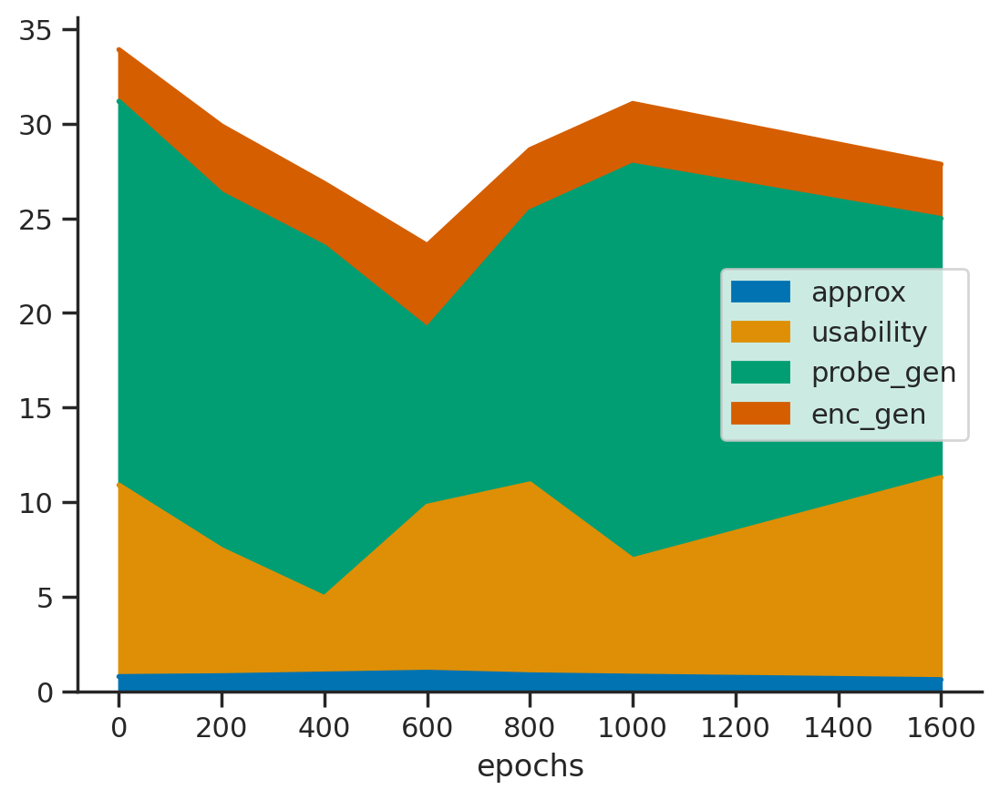

In [16]:
with plot_config(font_scale=1):
    curr_df = copy.deepcopy(df[COMPONENTS_ONLY + ["epochs"]])
    curr_df.epochs = curr_df.epochs // 200 * 200 # coarse grains
    curr_df.groupby("epochs").mean().plot.area()

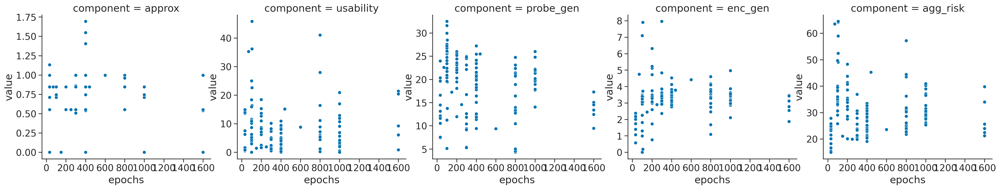

In [110]:
with plot_config():
    sns.relplot(data=melted, x="epochs", y="value", col="component", facet_kws={'sharey': False})

usability is going down

In [20]:
df_epochs = melt(get_only_vary(df, ["epochs"], core_params, 
                               drop_cols=["year","optimizer","learning_rate", 'weight_decay','z_layer']),
                components=COMPONENTS)
df_epochs["epochs"] = df_epochs["epochs"].astype(int)

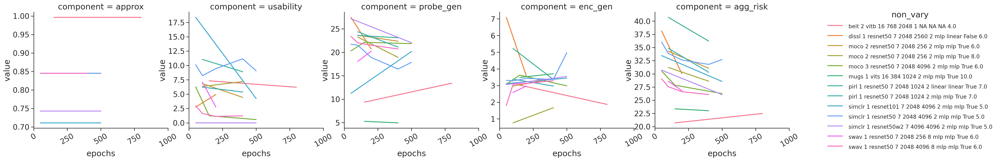

In [21]:
with plot_config():
    g = sns.relplot(data=df_epochs, x="epochs", y="value", hue="non_vary", col="component", kind="line",
                    facet_kws={'sharey': False})
    plt.setp(g._legend.get_texts(), fontsize=12)
    g.set_xticklabels(rotation=30)
    #g.set(yscale="log")
    #g.set(xscale="log")
    #sns.move_legend(g, "lower center", bbox_to_anchor=(0., 0.5, 0.7, 1.102))

In [29]:
ols_summary(df_epochs, "epochs", condition=['non_vary', 'np.log({treatment})'], f_outcome="log_delta", 
            objectives=COMPONENTS, is_short=True)

Could not find a model for approx
Could not find a model for usability
agg_risk
rmse: 0.8752969178212123, delta: 17.07594690667955


,Coef.,Std.Err.,t,P>|t|,[0.025,0.975]
np.log(epochs),-0.129558,0.027003,-4.797951,0.000144,-0.186289,-0.072827


In [23]:
treatment = "epochs" 
g,to_condition = causal_graph(treatment)
ols_summary(inp, treatment, objectives=COMPONENTS, condition=to_condition+["{treatment}"], is_short=True)

probe_gen
rmse: 2.6032608003906406, delta: 0


,Coef.,Std.Err.,t,P>|t|,[0.025,0.975]
epochs,-0.003017,0.000894,-3.375608,0.000984,-0.004786,-0.001248



agg_risk
rmse: 3.610676165222874, delta: 0


,Coef.,Std.Err.,t,P>|t|,[0.025,0.975]
epochs,-0.003099,0.00124,-2.499628,0.013739,-0.005553,-0.000645


## Naive plots
The following are naive plots where we plot everything without thinking about confounders. As a result they are likely meaningless for interpretaition but should rather be used as ways to understand our data.

### Effect of batch size

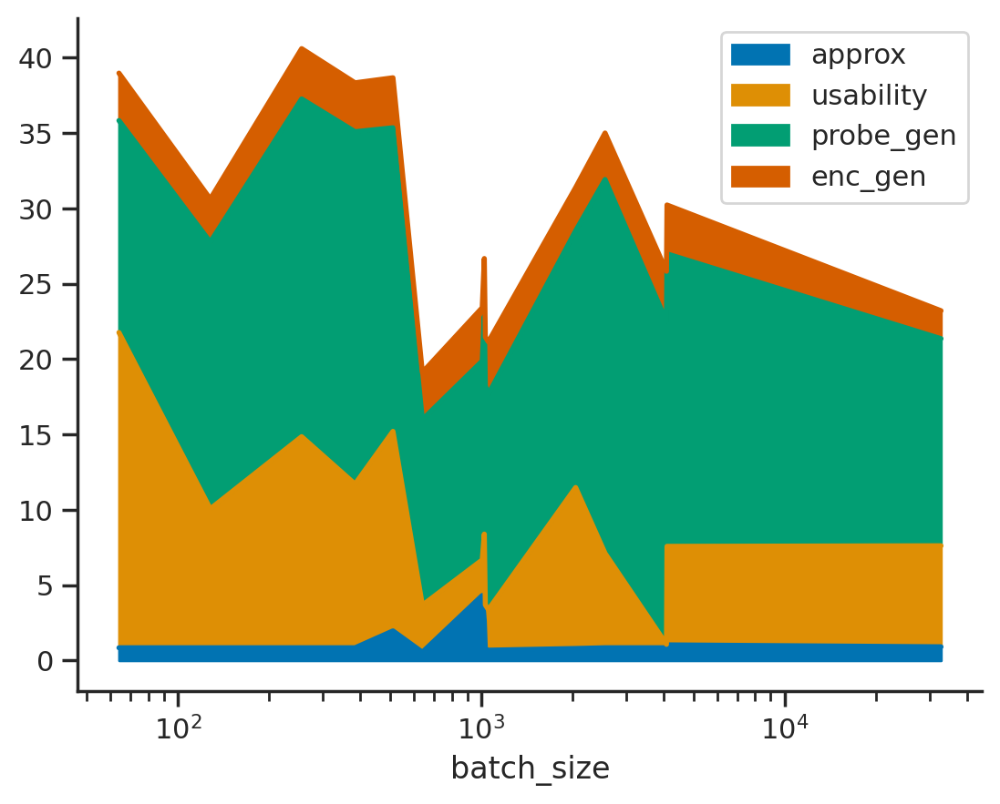

In [23]:
with plot_config(font_scale=1):
    curr_df = copy.deepcopy(df[COMPONENTS_ONLY + ["batch_size"]])
    curr_df.groupby("batch_size").mean().plot.area(logx=True)

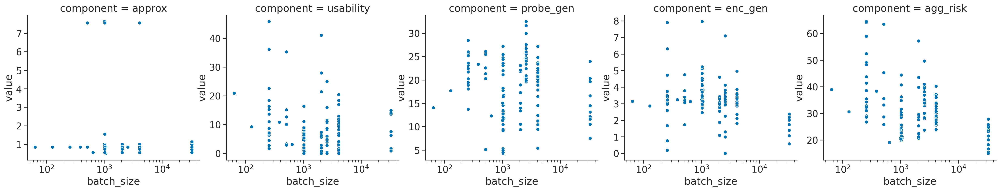

In [24]:
with plot_config():
    g=sns.relplot(data=melted, x="batch_size", y="value", col="component", facet_kws={'sharey': False})
    g.set(xscale="log")

### Effect of multicrops

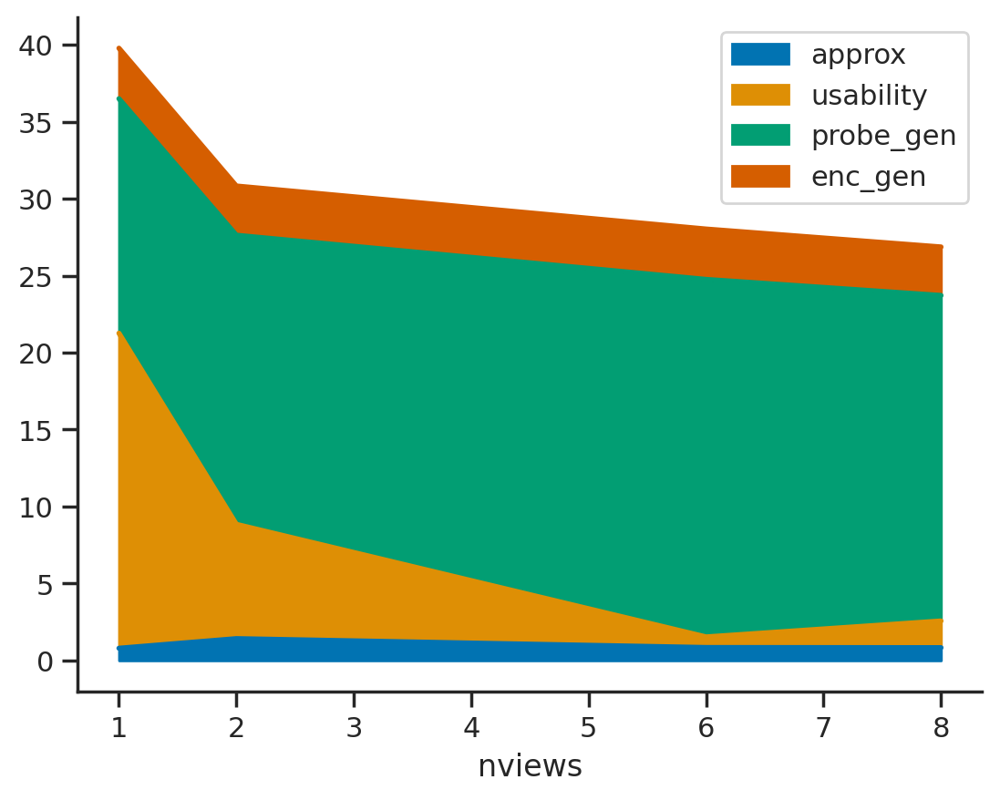

In [25]:
with plot_config(font_scale=1):
    curr_df = copy.deepcopy(df[COMPONENTS_ONLY + ["nviews"]])
    curr_df.groupby("nviews").mean().plot.area()

We see that nviews seems to have a huge effect on usability but detrimental effect on probing generalization. That being said there is probably a big confounder as few models (and usually more recent) use multicrops.

### Effect of architecture

#### N parameters

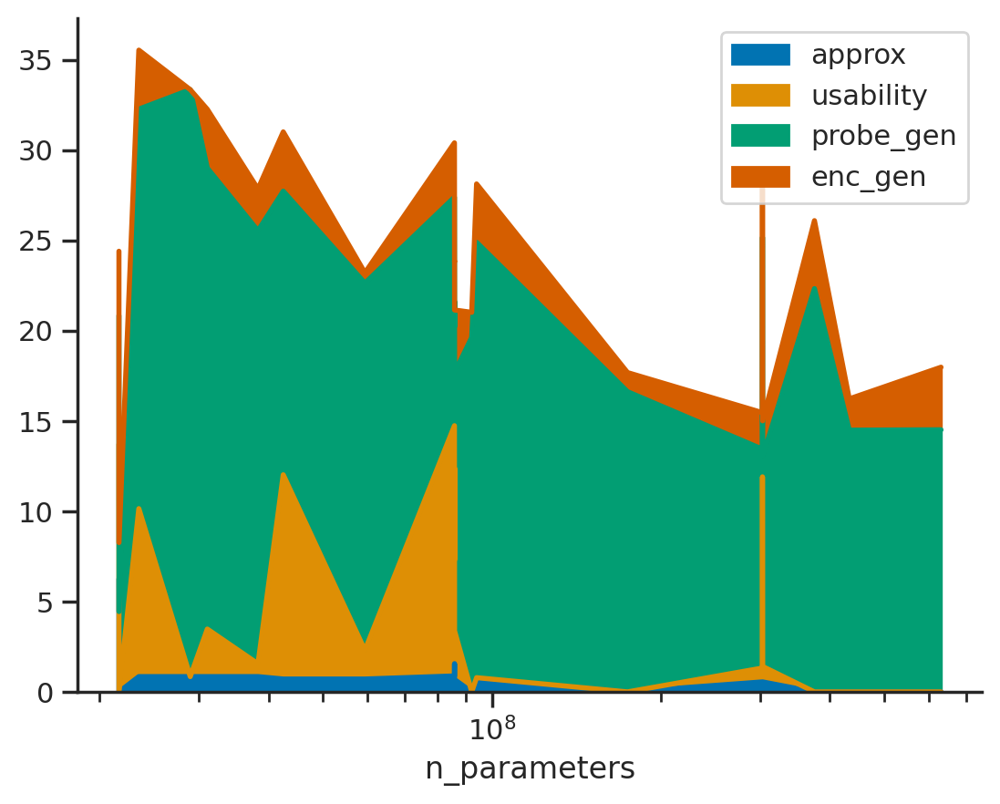

In [28]:
with plot_config(font_scale=1):
    curr_df = copy.deepcopy(df[COMPONENTS_ONLY + ["n_parameters"]])
    curr_df.groupby("n_parameters").mean().plot.area(logx=True)

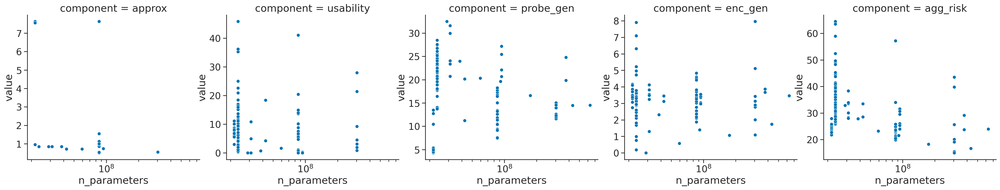

In [29]:
with plot_config():
    g=sns.relplot(data=melted, x="n_parameters", y="value", col="component", facet_kws={'sharey': False})
    g.set(xscale="log")

#### ViT vs ResNet

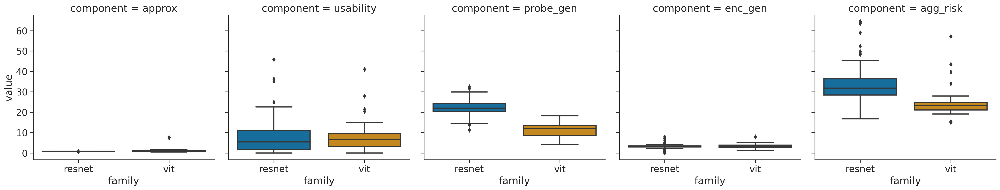

In [30]:
with plot_config():
    g=sns.catplot(data=melted, x="family", y="value", col="component", facet_kws={'sharey': False}, kind="box")
#g.set(xscale="log")

Appproximation gap seems slightly better.

#### Effect of patch size

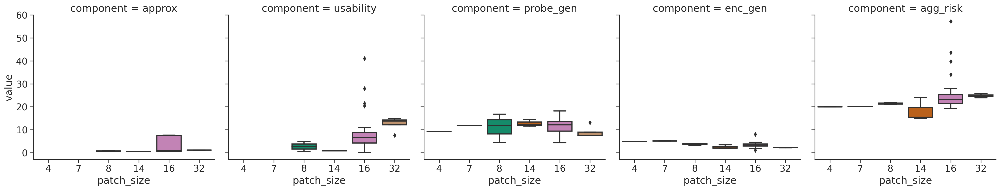

In [31]:
with plot_config():
    g=sns.catplot(data=melted[melted.family=="vit"], 
              x="patch_size", y="value", col="component", facet_kws={'sharey': False}, kind="box")
#g.set(xscale="log")

Larger patch size is worst approx

### Effect of pretraining data

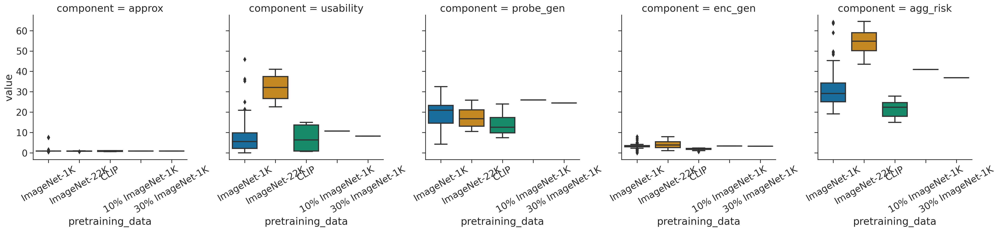

In [33]:
with plot_config():
    g=sns.catplot(data=melted, x="pretraining_data", y="value", col="component", facet_kws={'sharey': False}, kind="box")
    g.set_xticklabels(rotation=30)

### Effect of finetuning

In [34]:
curr_df = df.copy()
curr_df["is_finetuned"] = curr_df.finetuning_data.isna()

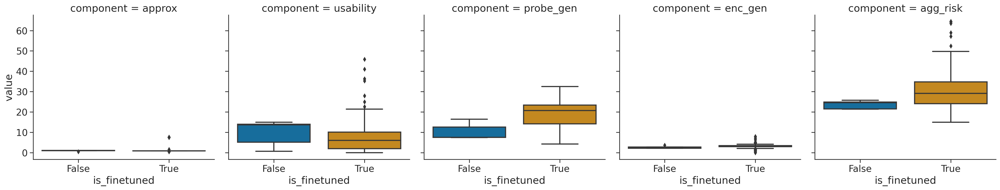

In [35]:
with plot_config():
    g=sns.catplot(data=melt(curr_df), x="is_finetuned", y="value", col="component", facet_kws={'sharey': False}, kind="box")
#g.set(xscale="log")

### Old derivations

For the derivation, note that we know by definition (besides empirical) that:
$$\mathrm{perf}(m,n) = \mathrm{usability}(m,n) + \mathrm{approx}(m,n) +  \mathrm{enc\_gen}(m)  +  \mathrm{probe\_gen}(m,n)$$ 
where $n$ is the number of samples and $m$ is the encoder. 
Now by standard scaling laws we also have:
$$ \mathrm{probe\_gen}(m,n) =  \mathrm{probe\_gen}(m,\infty) + \frac{C(m)}{n^{\alpha(m)}}$$

The issue is we do not have $\mathrm{probe\_gen}(m,\infty)$ but given that we know the decomposition at a specific $n=|\mathcal{D}_{train}|$ (i.e. ImageNet training size), we can use:
$$\mathrm{probe\_gen}(m,\infty)  =  \mathrm{probe\_gen}(m,|\mathcal{D}_{train}|) - \frac{C(m)}{|\mathcal{D}_{train}|^{\alpha(m)}}$$
so 

$$
\begin{aligned}
\mathrm{perf}(m,n) &= \mathrm{usability}(m,n) + \mathrm{approx}(m,n) +  \mathrm{enc\_gen}(m)  +  \mathrm{probe\_gen}(n) \\
&= \mathrm{usability} + \mathrm{approx} +  \mathrm{enc\_gen}  +   \mathrm{probe\_gen}(|\mathcal{D}_{train}|) - \frac{C}{|\mathcal{D}_{train}|^{\alpha}} + \frac{C}{n^{\alpha}} \\
\mathrm{perf}(n) - (\mathrm{usability} + \mathrm{approx} +  \mathrm{enc\_gen}) &=   \mathrm{probe\_gen}(|\mathcal{D}_{train}|) + C \left(\frac{1}{n^{\alpha}} - \frac{1}{|\mathcal{D}_{train}|^{\alpha}} \right)  \\
\end{aligned}
$$

Assuming that $|\mathcal{D}_{train}| \gg 0$ we have 
$$
\log( \mathrm{perf}(n) - (\mathrm{usability} + \mathrm{approx} +  \mathrm{enc\_gen})) \approx   \log \left(\mathrm{probe\_gen}(|\mathcal{D}_{train}|) + \frac{C}{n^{\alpha}} \right) 
$$



In [ ]:
def f_pred_param(params, data, model_var):
    return params["train_train"] +params["enc_gen"] + params["C"] *(1/(params["n"] ** params["alpha"]) - 1/(N ** params["alpha"]) ) + params["probe_gen"] 

_ = scalinglaw(data, 
               f_pred = f_pred_param,
               possible_params = ["C", "alpha"],
               independent_vars = dict(n=data["n_samples"], 
                                       probe_gen=data["probe_gen"],
                                       enc_gen=data["enc_gen"],
                                       train_train=data["train_train"],
                                      )
              ) 